<p style="align: center;"><img align=center src="https://drive.google.com/uc?export=view&id=1I2wUTT12p5bX3RCku_T_82aD4tkY9LVY" width=600 height=480/></p>
<h3 style="text-align: center;"><b>Школа глубокого обучения ФПМИ МФТИ</b></h3>

<h3 style="text-align: center;"><b>Домашнее задание. Сегментация изображений</b></h3>


В этом задании вам предстоит решить задачу сегментации медицинских снимков. Часть кода с загрузкой данных написана за вас. Всю содержательную сторону вопроса вам нужно заполнить самостоятельно. Задание оценивается из 15 баллов.

Обратите внимание, что отчёт по заданию стоит целых 6 баллов. Он вынесен в отдельный пункт в конце тетради. Это сделано для того, чтобы тетрадь была оформлена как законченный документ о проведении экспериментов. Неотъемлемой составляющей отчёта является ответ на следующие вопросы:

* Что было сделано? Что получилось реализовать, что не получилось?
* Какие результаты ожидалось получить?
* Какие результаты были достигнуты?
* Чем результаты различных подходов отличались друг от друга и от бейзлайна (если таковой присутствует)?




---


1. Для начала мы скачаем датасет: [ADDI project](https://www.fc.up.pt/addi/ph2%20database.html).

<table><tr><td>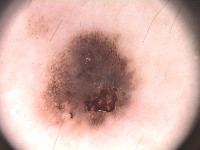</td><td>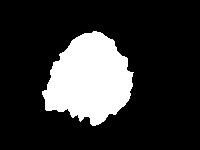</td></tr></table>

2. Разархивируем .rar файл.
3. Обратите внимание, что папка  `PH2 Dataset images` должна лежать там же где и ipynb notebook.

Это фотографии двух типов **поражений кожи:** меланома и родинки.
В данном задании мы не будем заниматься их классификацией, а будем **сегментировать** их.

In [4]:
!wget -c https://www.dropbox.com/s/8lqrloi0mxj2acu/PH2Dataset.rar

# если по ссылке слишком много запросов, датасет можно скачать с kaggle: https://www.kaggle.com/datasets/kanametov/ph2dataset

--2023-11-25 16:33:04--  https://www.dropbox.com/s/8lqrloi0mxj2acu/PH2Dataset.rar
Resolving www.dropbox.com (www.dropbox.com)... 162.125.3.18, 2620:100:6018:18::a27d:312
Connecting to www.dropbox.com (www.dropbox.com)|162.125.3.18|:443... connected.
HTTP request sent, awaiting response... 302 Found
Location: /s/raw/8lqrloi0mxj2acu/PH2Dataset.rar [following]
--2023-11-25 16:33:04--  https://www.dropbox.com/s/raw/8lqrloi0mxj2acu/PH2Dataset.rar
Reusing existing connection to www.dropbox.com:443.
HTTP request sent, awaiting response... 302 Found
Location: https://uce34ec9859a347af78c7cc29994.dl.dropboxusercontent.com/cd/0/inline/CIP14ofiS3Ukw05yAMtgzJfI2kucw1bCw28m5Ncql-d9loIAj5cljJ3PJqe7KJ4P1yZd1d_pK1BGf6g35gAvtzTe0JGFWE-fV_iJkbvSzwoRVpIWXud7v-_1DHjLap2yAjc/file# [following]
--2023-11-25 16:33:04--  https://uce34ec9859a347af78c7cc29994.dl.dropboxusercontent.com/cd/0/inline/CIP14ofiS3Ukw05yAMtgzJfI2kucw1bCw28m5Ncql-d9loIAj5cljJ3PJqe7KJ4P1yZd1d_pK1BGf6g35gAvtzTe0JGFWE-fV_iJkbvSzwoRVpIWXud7v

In [6]:
!ls

PH2Dataset.rar


In [ ]:
get_ipython().system_raw("unrar x PH2Dataset.rar")

Стуктура датасета у нас следующая:

    IMD_002/
        IMD002_Dermoscopic_Image/
            IMD002.bmp
        IMD002_lesion/
            IMD002_lesion.bmp
        IMD002_roi/
            ...
    IMD_003/
        ...
        ...

 Здесь `X.bmp` — изображение, которое нужно сегментировать, `X_lesion.bmp` — результат сегментации.

Для загрузки датасета можно использовать skimage: [`skimage.io.imread()`](https://scikit-image.org/docs/dev/api/skimage.io.html)

Будем грузить данные напрямую из каггла

In [2]:
images = []
lesions = []
from skimage.io import imread
import os
root = '/kaggle/input/ph2dataset/PH2Dataset'

for root, dirs, files in os.walk(os.path.join(root, 'PH2_Dataset')):
    if root.endswith('_Dermoscopic_Image'):
        images.append(imread(os.path.join(root, files[0])))
    if root.endswith('_lesion'):
        lesions.append(imread(os.path.join(root, files[0])))

/opt/conda/lib/python3.10/site-packages/scipy/__init__.py:146: UserWarning: A NumPy version >=1.16.5 and <1.23.0 is required for this version of SciPy (detected version 1.24.3
  warnings.warn(f"A NumPy version >={np_minversion} and <{np_maxversion}"


Изображения имеют разные размеры. Давайте изменим их размер на $256\times256 $ пикселей. Для изменения размера изображений можно использовать [`skimage.transform.resize()`](https://scikit-image.org/docs/dev/api/skimage.transform.html#skimage.transform.resize).
Эта функция также автоматически нормализует изображения в диапазоне $[0,1]$.


In [3]:
from skimage.transform import resize
size = (256, 256)
X = [resize(x, size, mode='constant', anti_aliasing=True,) for x in images]
Y = [resize(y, size, mode='constant', anti_aliasing=False) > 0.5 for y in lesions]

Проверим размеры

In [4]:
Y[100].shape

(256, 256)

In [5]:
X[100].shape

(256, 256, 3)

Чтобы убедиться, что все корректно, мы нарисуем несколько изображений

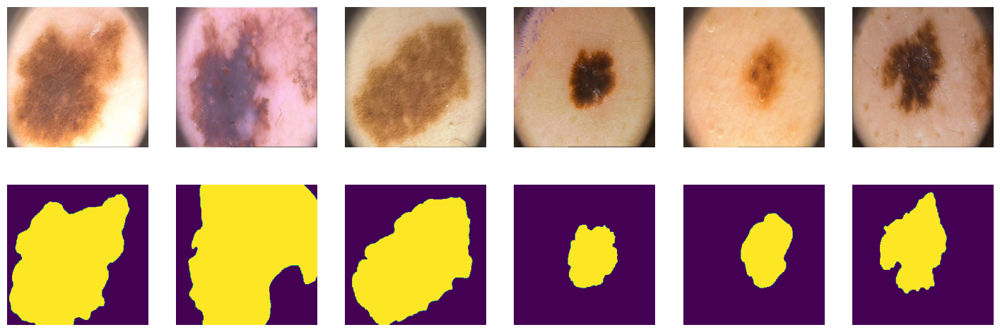

In [6]:
import matplotlib.pyplot as plt
from IPython.display import clear_output

plt.figure(figsize=(18, 6))
for i in range(6):
    plt.subplot(2, 6, i+1)
    plt.axis("off")
    plt.imshow(X[i])

    plt.subplot(2, 6, i+7)
    plt.axis("off")
    plt.imshow(Y[i])
plt.show();

Разделим наши 200 картинок на 100/50/50
 для обучения, валидации и теста соответственно

In [23]:
import numpy as np

In [25]:
np.random.seed(34)

In [26]:
ix = np.random.choice(len(X), len(X), False)
tr, val, ts = np.split(ix, [100, 150])

In [27]:
X = np.array(X, np.float32)
Y = np.array(Y, np.float32)
print(f'Loaded {len(X)} images')

Loaded 200 images


In [28]:
print(len(tr), len(val), len(ts))

100 50 50


#### PyTorch DataLoader

In [15]:
from torchvision import transforms
from torch.utils.data import Dataset, DataLoader
import torch


In [29]:
# Создание тензоров PyTorch из данных

X_tr, Y_tr = torch.from_numpy(X[tr]), torch.from_numpy(Y[tr])


print(X_tr.size())
print(Y_tr.size())

torch.Size([100, 256, 256, 3])
torch.Size([100, 256, 256])


Наш датасет очень маленький, я решил добавить аугментации по в виде горизонтальных и вертикальных отражений чтобы искусственно увеличить трейн выборку

In [30]:
X_aug = torch.flip(X_tr, dims=[1,2])

Y_aug = torch.flip(Y_tr, dims=[1,2])


Объединим полученные изображения с обучающей выборкой

In [31]:
X_tr = torch.cat((X_tr, X_aug), 0)
Y_tr = torch.cat((Y_tr, Y_aug), 0)


Проверим размер

In [32]:
print(X_tr.size())
print(Y_tr.size())

torch.Size([200, 256, 256, 3])
torch.Size([200, 256, 256])


Поскольку у нас задача на сравнение различных архитуктур функций потерь я решил что надо всем моделям давать на обучение одну и ту же обучающую выборку независищаю от работы шафла на DataLoader собственно поэтому аугментация и была реализована вручную и шафл мы тоже будем делать вручную ) а на. DataLoader его отключим

In [33]:
torch.manual_seed(34)

In [34]:
idx  = torch.randperm(X_tr.shape[0])
X_tr = X_tr[idx].view(X_tr.size())
Y_tr = Y_tr[idx].view(Y_tr.size())

Перемешали!

In [35]:
print(X_tr.size())
print(Y_tr.size())

torch.Size([200, 256, 256, 3])
torch.Size([200, 256, 256])


Создаем DataLoader не забывая правильно сделать структуру тензоров из batchxHxWxC  -> batcxCxHxW

In [36]:
batch_size = 25

data_tr = DataLoader(tuple(zip(X_tr.permute(0, 3, 1, 2),Y_tr[:,None,:,:])),
                     batch_size=batch_size, 
                     shuffle=False)
data_val = DataLoader(list(zip(np.rollaxis(X[val], 3, 1), Y[val, np.newaxis])),
                      batch_size=batch_size,
                      shuffle=False)
data_ts = DataLoader(list(zip(np.rollaxis(X[ts], 3, 1), Y[ts, np.newaxis])),
                     batch_size=batch_size, 
                     shuffle=False)

Проверим на всякий случай, что картинки после нашей аугментации, преобразований в тензоры и смены размерности еще картинки

In [37]:
X_, Y_ = next(iter(data_tr))



In [38]:
X_[0].size()

torch.Size([3, 256, 256])

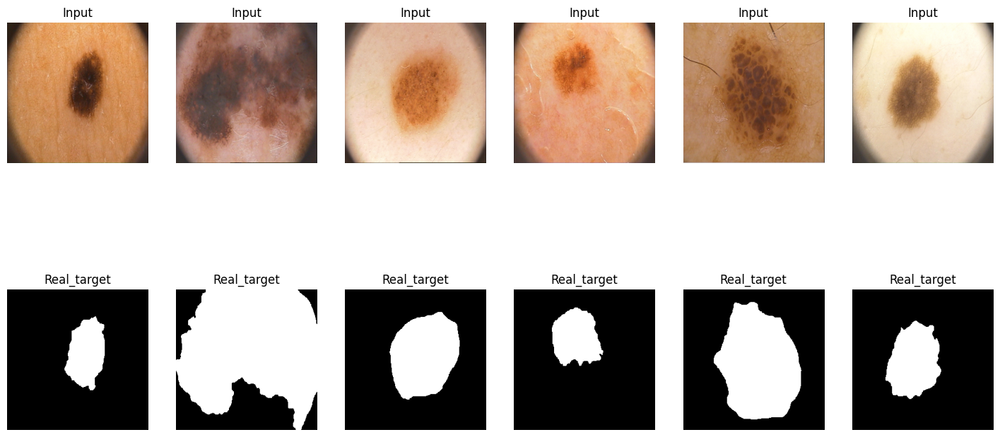

In [39]:
clear_output(wait=True)
plt.figure(figsize=(18, 9))
for k in range(6):
    plt.subplot(2, 6, k+1)
    plt.imshow(np.rollaxis(X_[k].numpy(), 0, 3), cmap='gray')  #show real picture
    plt.title('Input')
    plt.axis('off')

    plt.subplot(2, 6, k+7)
    plt.imshow(Y_[k, 0], cmap='gray')  #show target segmented picture
    plt.title('Real_target')
    plt.axis('off')

   
plt.show()

Все в порядке! Данные готовы, будем приступать!

In [40]:
import torch
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print(device)

cuda


# Реализация различных архитектур:
Ваше задание будет состоять в том, чтобы написать несколько нейросетевых архитектур для решения задачи семантической сегментации. Сравнить их по качеству на тесте и испробовать различные лосс функции для них.

-----------------------------------------------------------------------------------------

# SegNet [2 балла]

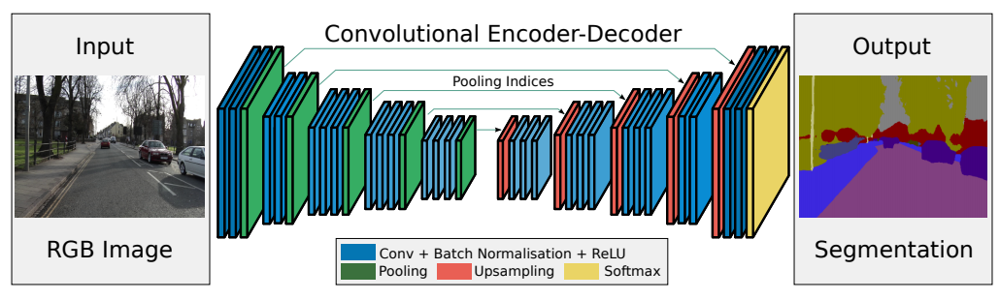

* Badrinarayanan, V., Kendall, A., & Cipolla, R. (2015). [SegNet: A deep convolutional
encoder-decoder architecture for image segmentation](https://arxiv.org/pdf/1511.00561.pdf)

Внимательно посмотрите из чего состоит модель и для чего выбраны те или иные блоки.

In [41]:
import torch
import torch.nn as nn
import torch.nn.functional as F
from torchvision import models
import torch.optim as optim
from time import time
from torch.optim import lr_scheduler

from matplotlib import rcParams
rcParams['figure.figsize'] = (15,4)

In [42]:

class SegNet(nn.Module):
    def __init__(self):
        super().__init__()

        # encoder (downsampling)
        # Each enc_conv/dec_conv block should look like this:
        # nn.Sequential(
        #     nn.Conv2d(...),
        #     ... (2 or 3 conv layers with relu and batchnorm),
        # )

        # первый сверточный слой с 64 фильтрами для изображения 256х256
        self.enc_conv0 = nn.Sequential(
            nn.Conv2d(3,64,3,padding=1),
            nn.BatchNorm2d(64),
            nn.ReLU(),
            nn.Conv2d(64,64,3,padding=1),
            nn.BatchNorm2d(64),
            nn.ReLU()

        )

        # пулинг будем использовать этот объект на всех слоях encoder
        
        self.MaxPool =  torch.nn.MaxPool2d(2, stride=2,  return_indices=True)

        # второй сверточный слой с 128 фильтрами для изображения 128*128
        self.enc_conv1 = nn.Sequential(
            nn.Conv2d(64,128,3,padding=1),
            nn.BatchNorm2d(128),
            nn.ReLU(),
            nn.Conv2d(128,128,3,padding=1),
            nn.BatchNorm2d(128),
            nn.ReLU()

        )


        # третий сверточный слой с 256 фильтрами для изображения 64*64

        self.enc_conv2 = nn.Sequential(
            nn.Conv2d(128,256,3,padding=1),
            nn.BatchNorm2d(256),
            nn.ReLU(),
            nn.Conv2d(256,256,3,padding=1),
            nn.BatchNorm2d(256),
            nn.ReLU(),
            nn.Conv2d(256,256,3,padding=1),
            nn.BatchNorm2d(256),
            nn.ReLU()

        )


        # четвертый сверточный слой с 512 фильтрами для изображения 32*32
        self.enc_conv3 = nn.Sequential(
            nn.Conv2d(256,512,3,padding=1),
            nn.BatchNorm2d(512),
            nn.ReLU(),
            nn.Conv2d(512,512,3,padding=1),
            nn.BatchNorm2d(512),
            nn.ReLU(),
            nn.Conv2d(512,512,3,padding=1),
            nn.BatchNorm2d(512),
            nn.ReLU()

        )

        
        # bottleneck  в ботлнеке будет просто макспулинг до 16х16 и соответственно затем анпулинг в 32х32 как предполагает архитектура SegNet из статьи
        
        
        # decoder (upsampling)
        self.upsample = nn.MaxUnpool2d(kernel_size=2, stride=2)

        # первый де-сверточный слой с 256 фильтрами на выходе
        self.dec_conv0 = nn.Sequential(
            nn.Conv2d(512,512,3,padding=1),
            nn.BatchNorm2d(512),
            nn.ReLU(),
            nn.Conv2d(512,512,3,padding=1),
            nn.BatchNorm2d(512),
            nn.ReLU(),
            nn.Conv2d(512,256,3,padding=1),
            nn.BatchNorm2d(256),
            nn.ReLU(),

        )

        # второй де-сверточный слой с 128 фильтрами на выходе
        self.dec_conv1 = nn.Sequential(
            nn.Conv2d(256,256,3,padding=1),
            nn.BatchNorm2d(256),
            nn.ReLU(),
            nn.Conv2d(256,256,3,padding=1),
            nn.BatchNorm2d(256),
            nn.ReLU(),
            nn.Conv2d(256,128,3,padding=1),
            nn.BatchNorm2d(128),
            nn.ReLU()

        )

        # третий де-сверточный слой с 64 фильтрами на выходе
        self.dec_conv2 = nn.Sequential(
            nn.Conv2d(128,128,3,padding=1),
            nn.BatchNorm2d(128),
            nn.ReLU(),
            nn.Conv2d(128,64,3,padding=1),
            nn.BatchNorm2d(64),
            nn.ReLU()

        )

        # четвертый де-сверточный слой с 1 фильтром на выходе

        self.dec_conv3 = nn.Sequential(
            nn.Conv2d(64,64,3,padding=1),
            nn.BatchNorm2d(64),
            nn.ReLU(),
            nn.Conv2d(64,64,3,padding=1),
            nn.BatchNorm2d(64),
            nn.ReLU(),
            nn.Conv2d(64,1,3,padding=1),

        )

    def forward(self, x):
        # encoder
        e0, idx0 = self.MaxPool(self.enc_conv0(x)) #на выходе [batch,64,128,128]
        e1, idx1 = self.MaxPool(self.enc_conv1(e0)) #на выходе [batch,128,64,64]
        e2, idx2 = self.MaxPool(self.enc_conv2(e1)) #на выходе [batch,256,32,32]
        e3, idx3 = self.MaxPool(self.enc_conv3(e2)) #на выходе [batch, 512,16,16]

        # bottleneck
        

        # decoder
        d0 = self.dec_conv0(self.upsample(e3, idx3)) #на выходе [batch 256,32,32]
        d1 = self.dec_conv1(self.upsample(d0, idx2)) #на выходе [batch,128,64,64]
        d2 = self.dec_conv2(self.upsample(d1, idx1)) #на выходе [batch,64,128,128]
        d3 = self.dec_conv3(self.upsample(d2, idx0)) #на выходе [batch,1,256,256]
         # no activation
        return d3

## Метрика

В данном разделе предлагается использовать следующую метрику для оценки качества:

$I o U=\frac{\text {target } \cap \text { prediction }}{\text {target } \cup{prediction }}$

Пересечение (A ∩ B) состоит из пикселей, найденных как в маске предсказания, так и в основной маске истины, тогда как объединение (A ∪ B) просто состоит из всех пикселей, найденных либо в маске предсказания, либо в целевой маске.


Для примера посмотрим на истину (слева) и предсказание (справа):
![alt text](https://www.jeremyjordan.me/content/images/2018/05/target_prediction.png)


Тогда пересечение и объединение будет выглядеть так:

![alt text](https://www.jeremyjordan.me/content/images/2018/05/intersection_union.png)

In [43]:
def iou_pytorch(outputs: torch.Tensor, labels: torch.Tensor):
    # You can comment out this line if you are passing tensors of equal shape
    # But if you are passing output from UNet or something it will most probably
    # be with the BATCH x 1 x H x W shape
    outputs = outputs.squeeze(1).byte()  # BATCH x 1 x H x W => BATCH x H x W
    labels = labels.squeeze(1).byte()
    SMOOTH = 1e-8
    intersection = (outputs & labels).float().sum((1, 2))  # Will be zero if Truth=0 or Prediction=0
    union = (outputs | labels).float().sum((1, 2))         # Will be zzero if both are 0

    iou = (intersection + SMOOTH) / (union + SMOOTH)  # We smooth our devision to avoid 0/0

    thresholded = torch.clamp(20 * (iou - 0.5), 0, 10).ceil() / 10  # This is equal to comparing with thresolds

    return thresholded  #

Метрика довольно хитро предложена нам для проекта! значение метрики iou меньше 0.5 будут просто превращаться в 0, а значения iou от 0.5 до 1  трансформируются в масштаб от 0 до 1. Об этом важно помнить, что скажем скор по этой метрике. 0.6 это значит что метрика IOU = 0.8 что уже неплохо

## Функция потерь [1 балл]

Не менее важным, чем построение архитектуры, является определение **оптимизатора** и **функции потерь.**

Функция потерь - это то, что мы пытаемся минимизировать. Многие из них могут быть использованы для задачи бинарной семантической сегментации.

Популярным методом для бинарной сегментации является *бинарная кросс-энтропия*, которая задается следующим образом:

$$\mathcal L_{BCE}(y, \hat y) = -\sum_i \left[y_i\log\sigma(\hat y_i) + (1-y_i)\log(1-\sigma(\hat y_i))\right].$$

где $y$ это  таргет желаемого результата и $\hat y$ является выходом модели. $\sigma$ - это [*логистическая* функция](https://en.wikipedia.org/wiki/Sigmoid_function), который преобразует действительное число $\mathbb R$ в вероятность $[0,1]$.

Однако эта потеря страдает от проблем численной нестабильности. Самое главное, что $\lim_{x\rightarrow0}\log(x)=\infty$ приводит к неустойчивости в процессе оптимизации. Рекомендуется посмотреть следующее [упрощение](https://www.tensorflow.org/api_docs/python/tf/nn/sigmoid_cross_entropy_with_logits). Эта функция эквивалентна первой и не так подвержена численной неустойчивости:

$$\mathcal L_{BCE} = \hat y - y\hat y + \log\left(1+\exp(-\hat y)\right).$$

In [44]:
def bce_loss(y_real, y_pred):
    # TODO
    y_real = y_real.view(-1) # "развернем" тензоор
    y_pred = y_pred.view(-1)
    loss = torch.mean(y_pred - y_real * y_pred + torch.log(1 + torch.exp(-y_pred)))
    # please don't use nn.BCELoss. write it from scratch
    return loss

Мы используем формулу которая принимает на вход логиты, а не вероятности!
То есть она ожидает для целевых "0" отрицательные числа  и для целого "1" положительные числа побольше в виде предсказаний, а НЕ вероятности от 0 до 1 )
Именно поэтому последний слой сети у нас просто без активации

## Тренировка [1 балл]

Мы определим цикл обучения в функции, чтобы мы могли повторно использовать его.

In [45]:
from tqdm.notebook import tqdm
import copy

In [46]:
def train(model, opt, scheduler, loss_fn, epochs, data_tr, data_val):
    X_val, Y_val = next(iter(data_val))
    history = {'train_loss':[],'val_loss':[]}
    best_loss = float('inf')

    for epoch in range(epochs):

        print('* Epoch %d/%d' % (epoch+1, epochs))

        avg_loss_tr = 0
        model.train()  # train mode
        for X_batch, Y_batch in tqdm(data_tr):
            # data to device
            X_batch = X_batch.to(device)
            Y_batch = Y_batch.to(device)
            # set parameter gradients to zero
            opt.zero_grad()

            # forward
            Y_pred = model(X_batch)
            loss = loss_fn(Y_batch, Y_pred ) # forward-pass
            loss.backward()  # backward-pass
            opt.step()  # update weights

            # calculate loss to show the user
            avg_loss_tr += loss.item() / len(data_tr)
        
        scheduler.step()

        history['train_loss'].append(avg_loss_tr) #будем писать сюда историю обучения
        print('train loss: %f' % avg_loss_tr)

        # show intermediate results
        model.eval()  # testing mode
        avg_loss_val = 0
        with torch.no_grad():
            for X_batch, Y_batch in tqdm(data_val):
              
            # data to device
              X_batch = X_batch.to(device)
              Y_batch = Y_batch.to(device)

              # forward
              Y_pred = model(X_batch)
              loss_val = loss_fn(Y_batch, Y_pred ) # forward-pass

              # calculate loss to show the user
              avg_loss_val += loss_val.item() / len(data_val)

        history['val_loss'].append(avg_loss_val)
        print('val loss: %f' % avg_loss_val)
        
        if avg_loss_val < best_loss:
            best_loss = avg_loss_val
            pars = copy.deepcopy(model.state_dict()) # save model pars for best loss 

            history['model_pars'] = pars    #save model to history list
            history['best_epoch'] = epoch+1 #save best epoch to history list

        
        with torch.no_grad():
            Y_hat = model(X_val.to(device)).detach().to('cpu') # detach and put into cpu

        # Visualize tools
        clear_output(wait=True)
        plt.figure(figsize=(18, 18))
        for k in range(6):
            plt.subplot(4, 6, k+1)
            plt.imshow(np.rollaxis(X_val[k].numpy(), 0, 3), cmap='gray')  #show real picture
            plt.title('Input')
            plt.axis('off')

            plt.subplot(4, 6, k+7)
            plt.imshow(Y_hat[k, 0], cmap='gray')   #show logits picture
            plt.title('Output_logits')
            plt.axis('off')

            plt.subplot(4, 6, k+13)
            plt.imshow(Y_hat[k, 0]>0.0, cmap='gray')   #show predicted segmented picture
            plt.title('Output_prediction')
            plt.axis('off')

            plt.subplot(4, 6, k+19)
            plt.imshow(Y_val[k, 0], cmap='gray')  #show target segmented picture
            plt.title('Real_target')
            plt.axis('off')

        plt.suptitle(f'{epoch+1}/{epochs} Epoch, train_loss = {round(history["train_loss"][-1],2)}, val_loss = {round(history["val_loss"][-1],2)} ')
        plt.show()
    return history

## Инференс [1 балл]

После обучения модели эту функцию можно использовать для прогнозирования сегментации на новых данных:

In [47]:
def predict(model, data):
    model.eval()  # testing mode
    with torch.no_grad():
      Y_pred = [ X_batch for X_batch, _ in data]
    return np.array(Y_pred)

Напишем функцию расчета скора
Самое важно что выходы модели надо сконвертировать в предсказания - то есть сегментированную картинку

In [48]:
def score_model(model, metric, data):
    model.eval()  # testing mode
    scores = 0
    with torch.no_grad():
        for X_batch, Y_batch in data:
            X_batch = X_batch.to(device)
            Y_pred = model(X_batch) 
            Y_pred = Y_pred.sigmoid()  # apply sigmoid
            Y_pred = Y_pred > 0.5   # convert probs to bool
            Y_batch = Y_batch.bool()  # convert target tensor to bool
            scores += metric(Y_pred, Y_batch.to(device)).mean().item()

    return scores/len(data)

## Основной момент: обучение

Обучите вашу модель. Обратите внимание, что обучать необходимо до сходимости. Если указанного количества эпох (20) не хватило, попробуйте изменять количество эпох до сходимости алгоритма. Сходимость определяйте по изменению функции потерь на валидационной выборке.
 С параметрами оптимизатора можно спокойно играть, пока вы не найдете лучший вариант для себя.


In [36]:
model = SegNet().to(device)

In [78]:
!pip install torchsummary

In [79]:
from torchsummary import summary

In [39]:
summary(model, (3, 256, 256))

----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Conv2d-1         [-1, 64, 256, 256]           1,792
       BatchNorm2d-2         [-1, 64, 256, 256]             128
              ReLU-3         [-1, 64, 256, 256]               0
            Conv2d-4         [-1, 64, 256, 256]          36,928
       BatchNorm2d-5         [-1, 64, 256, 256]             128
              ReLU-6         [-1, 64, 256, 256]               0
         MaxPool2d-7  [[-1, 64, 128, 128], [-1, 64, 128, 128]]               0
            Conv2d-8        [-1, 128, 128, 128]          73,856
       BatchNorm2d-9        [-1, 128, 128, 128]             256
             ReLU-10        [-1, 128, 128, 128]               0
           Conv2d-11        [-1, 128, 128, 128]         147,584
      BatchNorm2d-12        [-1, 128, 128, 128]             256
             ReLU-13        [-1, 128, 128, 128]               0
        MaxPool2d-14  [[

In [40]:
import gc
torch.cuda.empty_cache()
gc.collect()

0

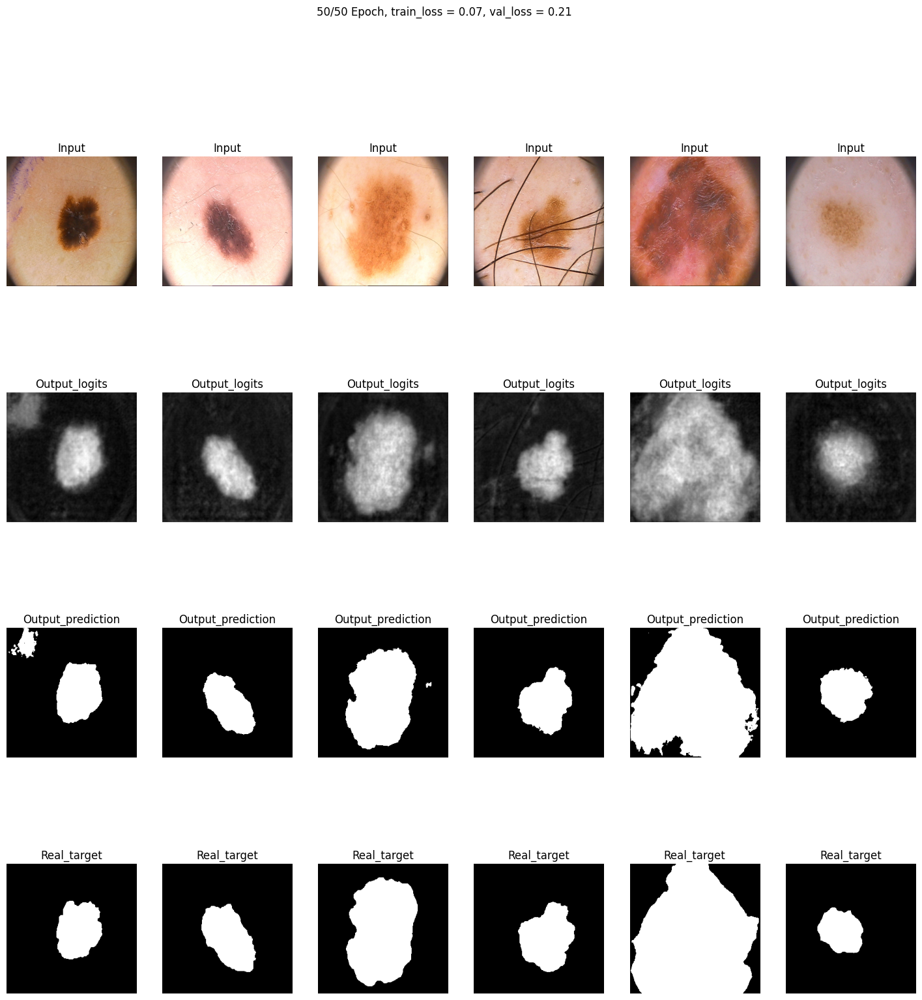

In [41]:
max_epochs = 50

model = SegNet().to(device)
optim = torch.optim.AdamW(model.parameters(), lr=0.0008)
scheduler = lr_scheduler.StepLR(optim,step_size=10, gamma=0.7)
history = train(model, optim, scheduler, bce_loss, max_epochs, data_tr, data_val)

In [42]:
import sys

Здесь и далее мы для интереса будем смотреть на какой эпохе было наименьшее значении функции потерь и затем смотреть нашу метрику на конец обучения, а затем будем сбрасывать модель и подгружать в заново инициализированную модель параметры которые были на лучшую эпоху и смотреть метрику там

In [43]:
history['best_epoch']

41

In [44]:
score_model(model, iou_pytorch, data_val)

0.7320000231266022

In [45]:
model = model.to(device)

In [46]:
model.load_state_dict(history['model_pars'])

<All keys matched successfully>

In [47]:
score_model(model, iou_pytorch, data_val)

0.7339999973773956

In [48]:
import seaborn as sns

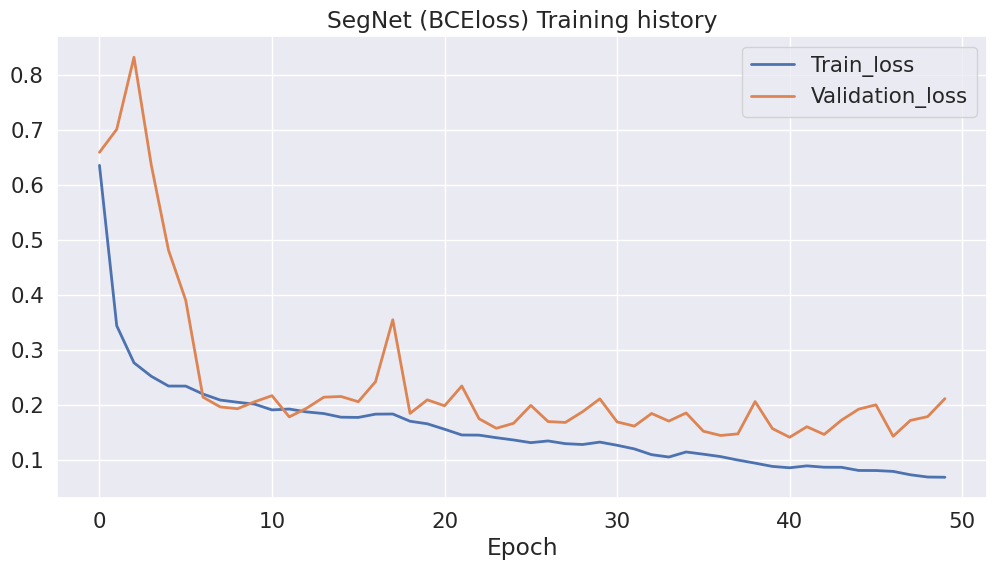

In [49]:
sns.set(style="darkgrid", font_scale=1.4)

plt.figure(figsize=(12, 6))
plt.title("SegNet (BCEloss) Training history")
plt.plot(range(max_epochs), history['train_loss'], label="Train_loss", linewidth=2)
plt.plot(range(max_epochs), history['val_loss'], label="Validation_loss", linewidth=2)
plt.legend()
plt.xlabel("Epoch")
plt.show()

Ответьте себе на вопрос: не переобучается ли моя модель?

Модель если и начала обучаться, то только ближе к концу(кажется что вот вот начнется восходящий тренд), впрочем нам это не страшно, так как мы фиксируем модель в точке достижения наименьшей функции потерь 

-----------------------------------------------------------------------------------------

## Дополнительные функции потерь [2 балла]

 В данном разделе вам потребуется имплементировать две функции потерь:
 DICE и Focal loss.
 Если у вас что-то не учится, велика вероятность, что вы ошиблись или учите слишком мало эпох, прежде чем бить тревогу попробуйте перебрать различные варианты и убедитесь, что во всех других сетапах сеть достигает желанного результата. СПОЙЛЕР: учиться она будет при всех лоссах, предложенных в этом задании.


**1. Dice coefficient:** Учитывая две маски $X$ и $Y$, общая метрика для измерения расстояния между этими двумя масками задается следующим образом:

$$D(X,Y)=\frac{2|X\cap Y|}{|X|+|Y|}$$

Эта функция не является дифференцируемой, но это необходимое свойство для градиентного спуска. В данном случае мы можем приблизить его с помощью:

$$\mathcal L_D(X,Y) = 1-\frac{1}{256 \times 256} \times \frac{\sum_i2X_iY_i}{\sum_iX_i+Y_i}.$$

Не забудьте подумать о численной нестабильности, возникающей в математической формуле.


In [50]:
def dice_loss(y_real, y_pred):

    y_real = y_real.view(-1) #  разворачиваем тензор
    y_pred = torch.sigmoid(y_pred.view(-1))  # применяем сигмоиду к логитам на выходе сети

    num = 2 * torch.sum(y_pred * y_real)
    den = torch.sum(y_pred + y_real)

    epsilon = 1e-4  # предохранитель от деления на ноль
    res = 1 - (num + epsilon) / (den + epsilon)

    return res

А тут мы для расчета лоссов должны подать вероятности поэтому будем прогонять выходы сети через сигмоиду множитель нормирующий на размер картинки тут ни к чему. У нас и так все нормируется за счет отношения сумм

Проводим тестирование:

In [51]:
torch.cuda.empty_cache()
gc.collect()

3958

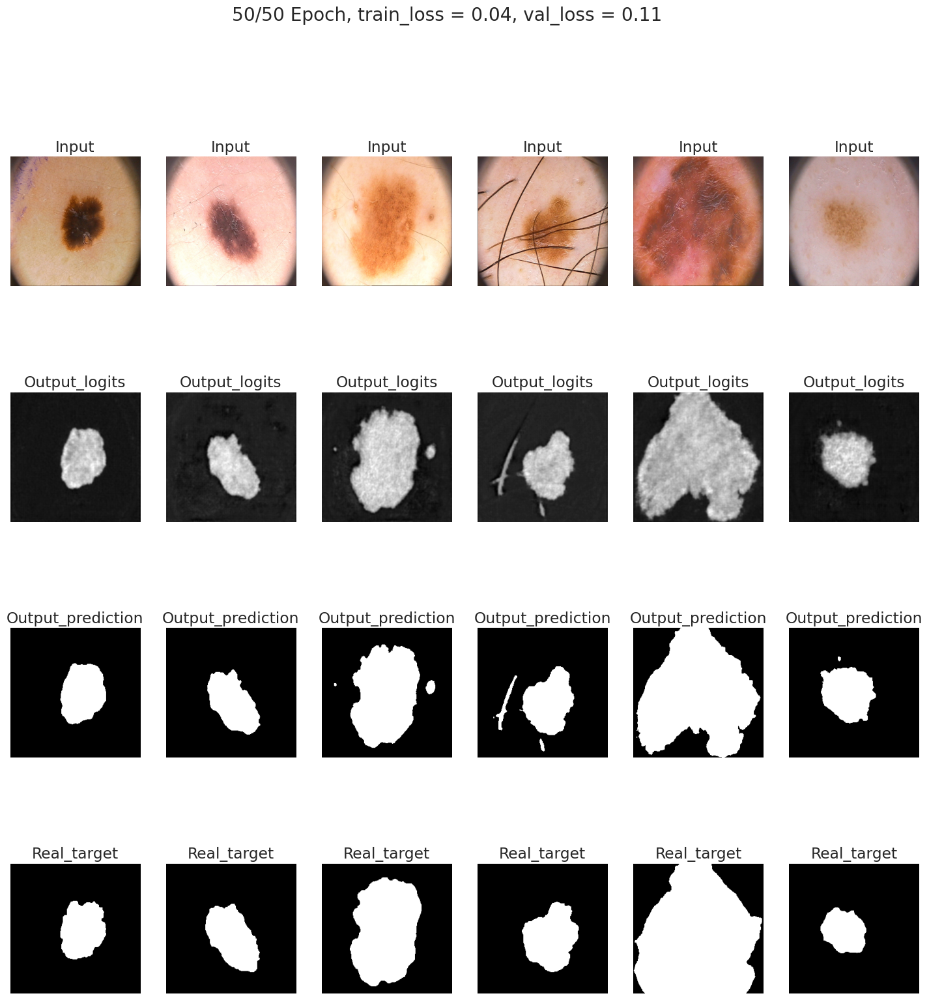

In [53]:
max_epochs = 50

model_dice = SegNet().to(device)
optim = torch.optim.AdamW(model_dice.parameters(), lr=0.0008)
scheduler = lr_scheduler.StepLR(optim,step_size=10, gamma=0.7)
history_dice = train(model_dice, optim, scheduler, dice_loss, max_epochs, data_tr, data_val)

In [54]:
history_dice['best_epoch']

27

In [55]:
model_dice = SegNet().to(device)
model_dice.load_state_dict(history_dice['model_pars'])

<All keys matched successfully>

In [56]:
score_model(model_dice, iou_pytorch, data_val)

0.7200000286102295

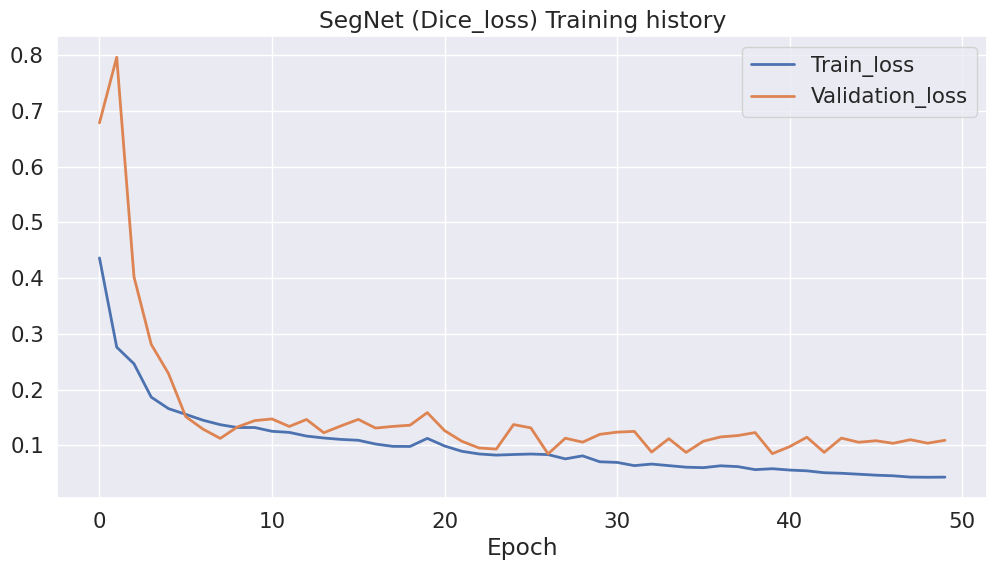

In [57]:
sns.set(style="darkgrid", font_scale=1.4)

plt.figure(figsize=(12, 6))
plt.title("SegNet (Dice_loss) Training history")
plt.plot(range(max_epochs), history_dice['train_loss'], label="Train_loss", linewidth=2)
plt.plot(range(max_epochs), history_dice['val_loss'], label="Validation_loss", linewidth=2)
plt.legend()
plt.xlabel("Epoch")
plt.show()

С DICE очень хорошо обучилась модель! Нет никаких всплесков лоссы на train и val очень близки

[**2. Focal loss:**](https://arxiv.org/pdf/1708.02002.pdf)

Окей, мы уже с вами умеем делать BCE loss:

$$\mathcal L_{BCE}(y, \hat y) = -\sum_i \left[y_i\log\sigma(\hat y_i) + (1-y_i)\log(1-\sigma(\hat y_i))\right].$$

Проблема с этой потерей заключается в том, что она имеет тенденцию приносить пользу классу **большинства** (фоновому) по отношению к классу **меньшинства** ( переднему). Поэтому обычно применяются весовые коэффициенты к каждому классу:

$$\mathcal L_{wBCE}(y, \hat y) = -\sum_i \alpha_i\left[y_i\log\sigma(\hat y_i) + (1-y_i)\log(1-\sigma(\hat y_i))\right].$$

Традиционно вес $\alpha_i$ определяется как обратная частота класса этого пикселя $i$, так что наблюдения миноритарного класса весят больше по отношению к классу большинства.

Еще одним недавним дополнением является взвешенный пиксельный вариант, которая взвешивает каждый пиксель по степени уверенности, которую мы имеем в предсказании этого пикселя.

$$\mathcal L_{focal}(y, \hat y) = -\sum_i \left[\left(1-\sigma(\hat y_i)\right)^\gamma y_i\log\sigma(\hat y_i) + (1-y_i)\log(1-\sigma(\hat y_i))\right].$$

Зафиксируем значение $\gamma=2$.

--------------------------------------------------------------------------------


In [58]:
def focal_loss(y_real, y_pred, eps = 1e-4, gamma = 2):
    y_pred = torch.clamp(torch.sigmoid(y_pred.view(-1)), min=0+eps, max=1-eps) # hint: torch.clamp
    y_real = y_real.view(-1)

    loss = - torch.mean(((1-y_pred).pow(gamma))*y_real*torch.log(y_pred)+(1-y_real)*torch.log(1-y_pred))
    return loss


Просто реализуем предложенную формулу! В Формуле забыли указать, что хорошо бы конечно это все отнормировать, а не просто взять сумму лоссов по всем пикселям в батче ), ну да ладно мы возьмем среднее и все будет в порядке )

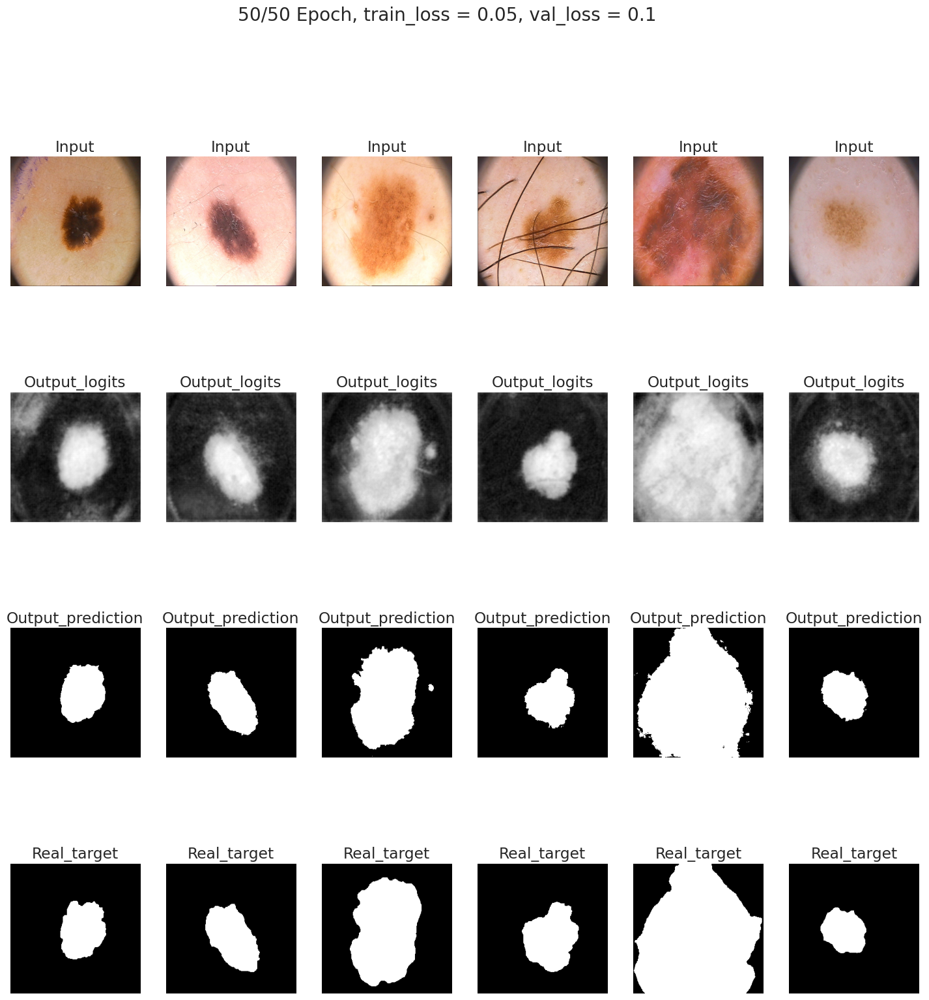

In [59]:
model_focal = SegNet().to(device)
optim = torch.optim.AdamW(model_focal.parameters(), lr=0.0008)
scheduler = lr_scheduler.StepLR(optim,step_size=10, gamma=0.7)
history_focal = train(model_focal, optim, scheduler, focal_loss, max_epochs, data_tr, data_val)

In [60]:
history_focal['best_epoch']

35

In [61]:
score_model(model_focal, iou_pytorch, data_val)

0.7240000367164612

In [62]:
model_focal = SegNet().to(device)
model_focal.load_state_dict(history_focal['model_pars'])

<All keys matched successfully>

In [63]:
score_model(model_focal, iou_pytorch, data_val)

0.7520000040531158

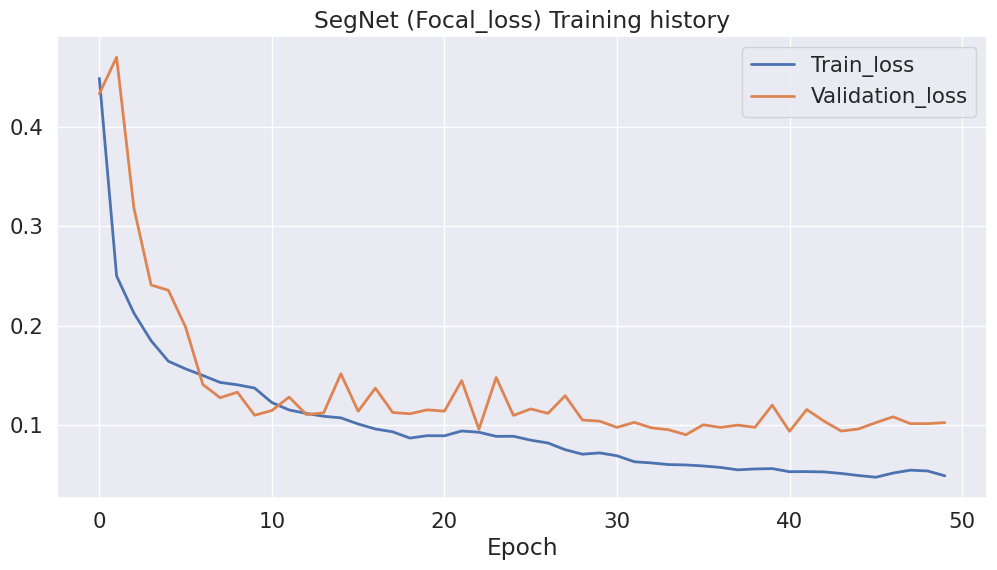

In [64]:
sns.set(style="darkgrid", font_scale=1.4)

plt.figure(figsize=(12, 6))
plt.title("SegNet (Focal_loss) Training history")
plt.plot(range(max_epochs), history_focal['train_loss'], label="Train_loss", linewidth=2)
plt.plot(range(max_epochs), history_focal['val_loss'], label="Validation_loss", linewidth=2)
plt.legend()
plt.xlabel("Epoch")
plt.show()

Обучение на Focal выглядит не плохо правда после 30 эпохи потери на валидации откровенно встали.

----------------------------------------------------------------------------------------------

## [BONUS] Мир сегментационных лоссов [5 баллов]

В данном блоке предлагаем вам написать одну функцию потерь самостоятельно. Для этого необходимо прочитать статью и имплементировать ее. Кроме того провести численное сравнение с предыдущими функциями.
Какие варианты?

1) Можно учесть Total Variation
2) Lova
3) BCE но с Soft Targets (что-то типа label-smoothing для многослассовой классификации)
4) Любой другой

* [Physiological Inspired Deep Neural Networks for Emotion Recognition](https://ieeexplore.ieee.org/stamp/stamp.jsp?arnumber=8472816&tag=1)". IEEE Access, 6, 53930-53943.

* [Boundary loss for highly unbalanced segmentation](https://arxiv.org/abs/1812.07032)

* [Tversky loss function for image segmentation using 3D fully convolutional deep networks](https://arxiv.org/abs/1706.05721)

* [Correlation Maximized Structural Similarity Loss for Semantic Segmentation](https://arxiv.org/abs/1910.08711)

* [Topology-Preserving Deep Image Segmentation](https://papers.nips.cc/paper/8803-topology-preserving-deep-image-segmentation)

Так как Тверский лосс очень похож на данные выше, то за него будет проставлено только 3 балла (при условии, если в модели нет ошибок при обучении). Постарайтесь сделать что-то интереснее.

**Correlation Maximized Structural Similarity Loss for Semantic Segmentation**

Данный лосс предполагает локальный расчет статистик изображения: $\mu$ и $\sigma^2$ 
Для этого используется круговая-симметричная функция Гаусса

На самом деле ничего страшного это просто ядро свертки с весами сумма которых будет 1 и значения весов будут нормально убывать от центрального пикселя ядра к другим
Реализуется следующим образом:

In [56]:
def create_gaussian_kernel_n(size, std):
    """Create a circular-symmetric 2D Gaussian kernel."""
    coords = torch.arange(size, dtype=torch.float32) - (size - 1) / 2
    grid = coords.view(-1, 1).repeat(1, size)
    distance = torch.sqrt(grid**2 + grid.t()**2)
    
    kernel = torch.exp(-distance**2 / (2 * std**2))
    kernel /= kernel.sum()
    
    return kernel.view(1, 1, size, size)

In [57]:
def struct_sim_loss(y_real, y_pred, size=3):
    #зададим константы можно конечно сделать как параметры функции но к чему?
    BETTA = 0.1
    EMAXDIFF = 4.6716
    LAMBDA = 0.5
    EPS = 1e-4
    
    y_pred = torch.clamp(torch.sigmoid(y_pred), min=0+EPS, max=1-EPS)   #преобразуем выходы модели в вероятности
    gauss_kernel = create_gaussian_kernel_n(size,1.5)  #инициализируем гауссовское ядро которое будем использовать для расчета локальных статистик
    gauss_kernel = gauss_kernel.to(device)
    
    mu_real = F.conv2d(y_real, gauss_kernel, padding = size//2) #считаем локальные средние с помощью операции свертки нашего изображения нашим ядром
    mu_pred = F.conv2d(y_pred, gauss_kernel, padding = size//2) 
    
    #mu_real и mu_pred будут иметь те же размеры что и исходное изображение, но значения пикселей это локальные средние
    
    stab_factor = 0.01

    sigma_sqr_real = mu_real - mu_real.pow(2) + stab_factor #в статье показано почему для расчета дисперсии таргета формулу можно упростить
    sigma_sqr_pred = F.conv2d((y_pred-mu_pred).pow(2), gauss_kernel, padding = size//2) # расчет локальных дисперсии для образца предсказаний
    
   
    
    y_real_norm = (y_real - mu_real + stab_factor) / (sigma_sqr_real.pow(0.5) + stab_factor) # нормировка изображений в соответствиие с посчитанными локальными статистиками
    
    y_pred_norm = (y_pred - mu_pred + stab_factor) / (sigma_sqr_pred.pow(0.5) + stab_factor) # нормировка изображений в соответствиие с посчитанными локальными статистиками
    
   
    e = (y_real_norm - y_pred_norm).abs()  #сравниваем структуру отнормированных изображений попиксельно получается и считаем абсолютное расхождение
    
    f = e > EMAXDIFF*BETTA  #в статье нам предлагается не использовать те образцы где расхождение очень маленькое
    
    cross_entropy = F.binary_cross_entropy(y_pred, y_real,reduction='none')  #cчитаем попиксельно кросс-энтропию между предсказаниям и таргетом
    
    
    ssl = (e * f * cross_entropy).sum() / (f.sum())  #считаем наш ssl loss, все суммируем нормируем но среднее считаем вручную так как надо делить только на кол-во пикселей у которых е было выше порога
     
    all_loss = LAMBDA*cross_entropy.mean()+(1-LAMBDA)*ssl  #итоговый loss половинка от кросс-энтропии и еще половинка от "перевзвешенной" по ssl кроссэнтропии.
    
    return all_loss
    


In [71]:
import gc
gc.collect()
torch.cuda.empty_cache()

In [72]:
torch.cuda.empty_cache()

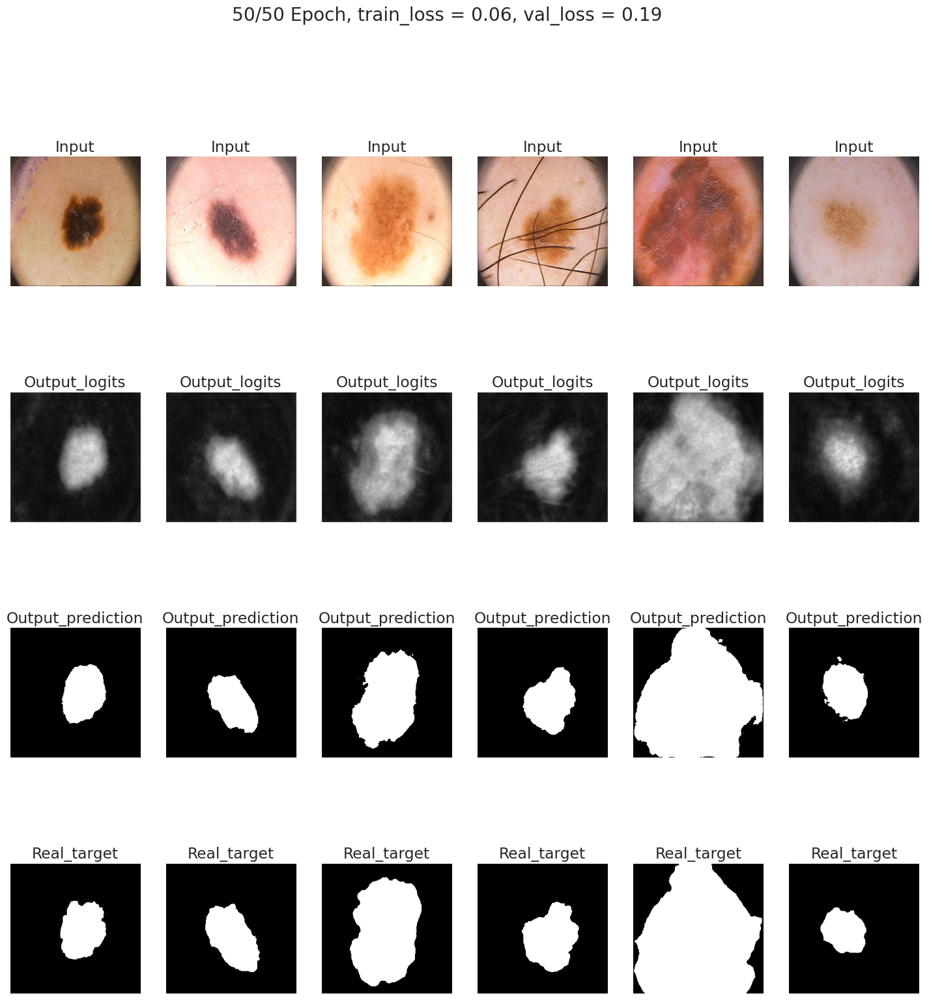

In [73]:
model_ssl_loss = SegNet().to(device)
max_epochs = 50
optim = torch.optim.AdamW(model_ssl_loss.parameters(), lr=0.0008)
scheduler = lr_scheduler.StepLR(optim,step_size=10, gamma=0.7)
history_ssl_loss = train(model_ssl_loss, optim, scheduler, struct_sim_loss, max_epochs, data_tr, data_val)

Удивительно но оно работает! )))

In [84]:
history_ssl_loss['best_epoch']

25

In [85]:
score_model(model_ssl_loss, iou_pytorch, data_val)

0.7379999756813049

И даже неплохо работает )

In [100]:
model_ssl = SegNet().to(device)
model_ssl.load_state_dict(history_ssl_loss['model_pars'])

<All keys matched successfully>

In [101]:
score_model(model_ssl, iou_pytorch, data_val)

0.6519999802112579

In [88]:
import seaborn as sns

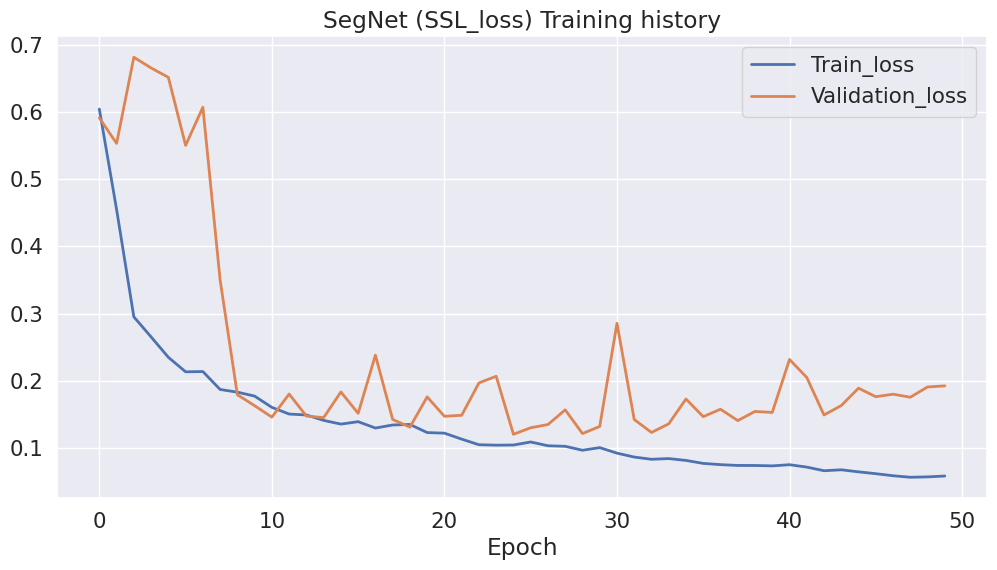

In [89]:
sns.set(style="darkgrid", font_scale=1.4)

plt.figure(figsize=(12, 6))
plt.title("SegNet (SSL_loss) Training history")
plt.plot(range(max_epochs), history_ssl_loss['train_loss'], label="Train_loss", linewidth=2)
plt.plot(range(max_epochs), history_ssl_loss['val_loss'], label="Validation_loss", linewidth=2)
plt.legend()
plt.xlabel("Epoch")
plt.show()

Хотя на графиках конечно видно, что лосс довольно сильно скачет на валидации и в целом модель кажется начала переобучаться после 30 эпохи

-----------------------------------------------------------------------------------------

# U-Net [2 балла]

[**U-Net**](https://arxiv.org/abs/1505.04597) — это архитектура нейронной сети, которая получает изображение и выводит его. Первоначально он был задуман для семантической сегментации (как мы ее будем использовать), но он настолько успешен, что с тех пор используется в других контекстах. Получая на вход медицинское изображение, он выведет изображение в оттенках серого, где интенсивность каждого пикселя зависит от вероятности того, что этот пиксель принадлежит интересующей нас области.

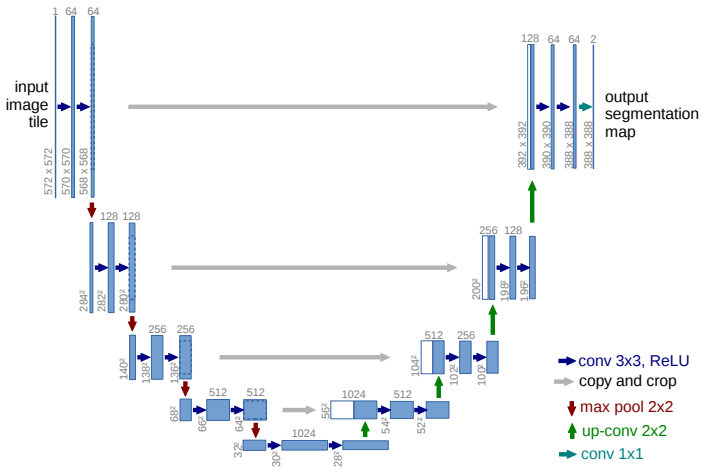

У нас в архитектуре все так же существует энкодер и декодер, как в **SegNet**, но отличительной особеностью данной модели являются *skip-conenctions*, соединяющие части декодера и энкодера. То есть для того чтобы передать на вход декодера тензор, мы конкатенируем симметричный выход с энкодера и выход предыдущего слоя декодера.

* Ronneberger, Olaf, Philipp Fischer, and Thomas Brox. "[U-Net: Convolutional networks for biomedical image segmentation.](https://arxiv.org/pdf/1505.04597.pdf)" International Conference on Medical image computing and computer-assisted intervention. Springer, Cham, 2015.

In [52]:
class UNet(nn.Module):
    def __init__(self):
        super().__init__()

        
        self.maxpool = nn.MaxPool2d(kernel_size=2, stride=2, return_indices=True)
        
        self.upsample = nn.MaxUnpool2d(kernel_size=2, stride=2)
        
        #256 -> 128
        
        self.enc_conv0 = nn.Sequential(
            nn.Conv2d(3,64,3,padding=1),
            nn.BatchNorm2d(64),
            nn.ReLU(),
            nn.Conv2d(64,64,3,padding=1),
            nn.BatchNorm2d(64),
            nn.ReLU()

        ) 
       
        # 128 -> 64
      
        self.enc_conv1 = nn.Sequential(
            nn.Conv2d(64,128,3,padding=1),
            nn.BatchNorm2d(128),
            nn.ReLU(),
            nn.Conv2d(128,128,3,padding=1),
            nn.BatchNorm2d(128),
            nn.ReLU()

        )
        
        # 64 -> 32
        
        self.enc_conv2 = nn.Sequential(
            nn.Conv2d(128,256,3,padding=1),
            nn.BatchNorm2d(256),
            nn.ReLU(),
            nn.Conv2d(256,256,3,padding=1),
            nn.BatchNorm2d(256),
            nn.ReLU(),
            nn.Conv2d(256,256,3,padding=1),
            nn.BatchNorm2d(256),
            nn.ReLU()

        )
        
        # 32 -> 16
        
        self.enc_conv3 = nn.Sequential(
            nn.Conv2d(256,512,3,padding=1),
            nn.BatchNorm2d(512),
            nn.ReLU(),
            nn.Conv2d(512,512,3,padding=1),
            nn.BatchNorm2d(512),
            nn.ReLU()

        )
    

        # bottleneck
        self.bottleneck_conv = nn.Sequential(
            nn.Conv2d(512,1024,3,padding=1),
            nn.BatchNorm2d(1024),
            nn.ReLU(),
            nn.Conv2d(1024,1024,3,padding=1),
            nn.BatchNorm2d(1024),
            nn.ReLU(),
            nn.Conv2d(1024,512,3,padding=1),
            nn.BatchNorm2d(512),
            nn.ReLU()

        )

        # decoder (upsampling)
        
        # 16 -> 32
        self.dec_conv0 = nn.Sequential(
            nn.Conv2d(1024,512,3,padding=1),
            nn.BatchNorm2d(512),
            nn.ReLU(),
            nn.Conv2d(512,512,3,padding=1),
            nn.BatchNorm2d(512),
            nn.ReLU(),
            nn.Conv2d(512,256,3,padding=1),
            nn.BatchNorm2d(256),
            nn.ReLU()

        )
        
        # 32 -> 64
        self.dec_conv1 = nn.Sequential(
            nn.Conv2d(512,256,3,padding=1),
            nn.BatchNorm2d(256),
            nn.ReLU(),
            nn.Conv2d(256,256,3,padding=1),
            nn.BatchNorm2d(256),
            nn.ReLU(),
            nn.Conv2d(256,128,3,padding=1),
            nn.BatchNorm2d(128),
            nn.ReLU(),

        )
        
        
        # 64 -> 128
        self.dec_conv2 = nn.Sequential(
            nn.Conv2d(256,128,3,padding=1),
            nn.BatchNorm2d(128),
            nn.ReLU(),
            nn.Conv2d(128,128,3,padding=1),
            nn.BatchNorm2d(128),
            nn.ReLU(),
            nn.Conv2d(128,64,3,padding=1),
            nn.BatchNorm2d(64),
            nn.ReLU(),

        )
        
        # 128 -> 256
        self.dec_conv3 = nn.Sequential(
            nn.Conv2d(128,64,3,padding=1),
            nn.BatchNorm2d(64),
            nn.ReLU(),
            nn.Conv2d(64,64,3,padding=1),
            nn.BatchNorm2d(64),
            nn.ReLU(),
            nn.Conv2d(64,1,1)
            
        )

    def forward(self, x):
        
        # encoder
        e0_256 = self.enc_conv0(x)
        e0_128, idx128 = self.maxpool(e0_256)
        
        e1_128 = self.enc_conv1(e0_128)
        e1_64, idx64 = self.maxpool(e1_128)
        
        e2_64 = self.enc_conv2(e1_64)
        e2_32, idx32 = self.maxpool(e2_64)
        
        e3_32 = self.enc_conv3(e2_32)
        e3_16, idx16 = self.maxpool(e3_32)

        # bottleneck
        b = self.bottleneck_conv(e3_16)

        # decoder
        d0 = self.dec_conv0(torch.cat([self.upsample(b, idx16, output_size=e3_32.size()), e3_32], dim=1))

        d1 = self.dec_conv1(torch.cat([self.upsample(d0, idx32, output_size=e2_64.size()), e2_64], dim=1))
        
        d2 = self.dec_conv2(torch.cat([self.upsample(d1, idx64, output_size=e1_128.size()), e1_128], dim=1))
        
        d3 = self.dec_conv3(torch.cat([self.upsample(d2, idx128, output_size=e0_256.size()), e0_256], dim=1))
        
        # no activation
        return d3

In [91]:
unet_model = UNet().to(device)

In [92]:
summary(unet_model, (3, 256, 256))

----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Conv2d-1         [-1, 64, 256, 256]           1,792
       BatchNorm2d-2         [-1, 64, 256, 256]             128
              ReLU-3         [-1, 64, 256, 256]               0
            Conv2d-4         [-1, 64, 256, 256]          36,928
       BatchNorm2d-5         [-1, 64, 256, 256]             128
              ReLU-6         [-1, 64, 256, 256]               0
         MaxPool2d-7  [[-1, 64, 128, 128], [-1, 64, 128, 128]]               0
            Conv2d-8        [-1, 128, 128, 128]          73,856
       BatchNorm2d-9        [-1, 128, 128, 128]             256
             ReLU-10        [-1, 128, 128, 128]               0
           Conv2d-11        [-1, 128, 128, 128]         147,584
      BatchNorm2d-12        [-1, 128, 128, 128]             256
             ReLU-13        [-1, 128, 128, 128]               0
        MaxPool2d-14  [[

In [93]:
import gc

gc.collect()
torch.cuda.empty_cache()

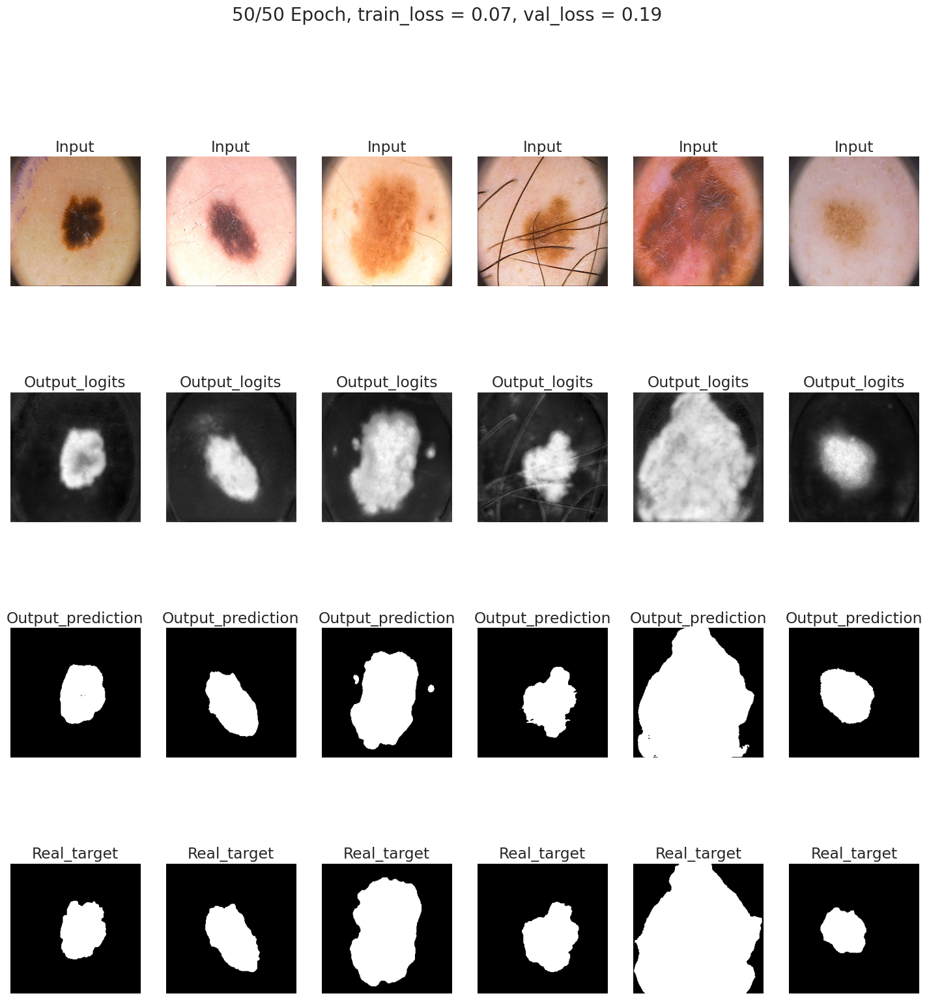

In [95]:
optim = torch.optim.AdamW(unet_model.parameters(), lr=0.0008)
scheduler = lr_scheduler.StepLR(optim,step_size=10, gamma=0.7)
history_unet = train(unet_model, optim, scheduler, bce_loss, max_epochs, data_tr, data_val)

In [96]:
score_model(unet_model, iou_pytorch, data_val)

0.7380000054836273

In [102]:
history_unet['best_epoch']

25

In [103]:
unet_model = UNet().to(device)
unet_model.load_state_dict(history_unet['model_pars'])

<All keys matched successfully>

In [104]:
score_model(unet_model, iou_pytorch, data_val)

0.7100000381469727

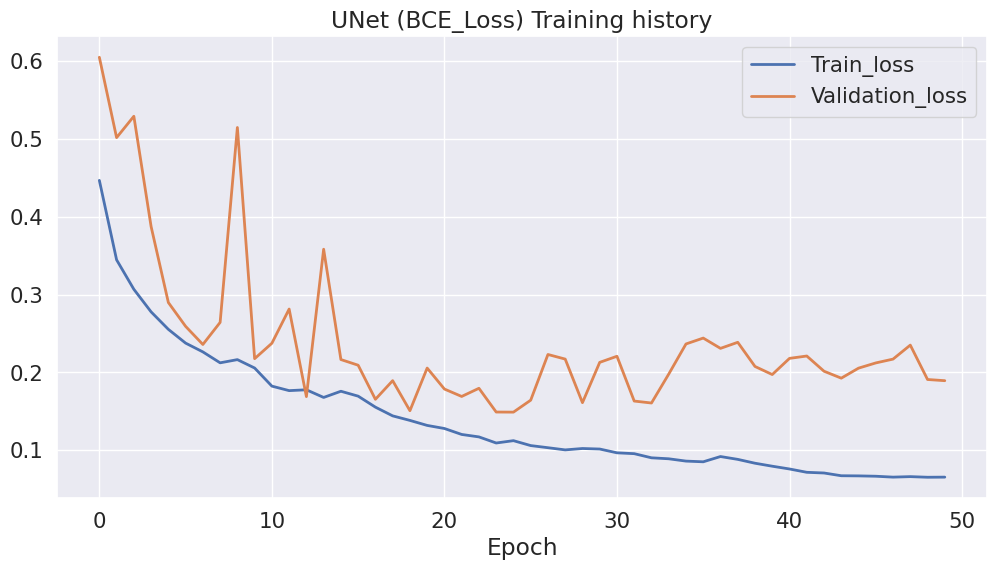

In [107]:
sns.set(style="darkgrid", font_scale=1.4)

plt.figure(figsize=(12, 6))
plt.title("UNet (BCE_Loss) Training history")
plt.plot(range(max_epochs), history_unet['train_loss'], label="Train_loss", linewidth=2)
plt.plot(range(max_epochs), history_unet['val_loss'], label="Validation_loss", linewidth=2)
plt.legend()
plt.xlabel("Epoch")
plt.show()

Новая модель путем изменения типа пулинга:

 **Max-Pooling** for the downsampling and **nearest-neighbor Upsampling** for the upsampling.

Down-sampling:

        conv = nn.Conv2d(3, 64, 3, padding=1)
        pool = nn.MaxPool2d(3, 2, padding=1)

Up-Sampling

        upsample = nn.Upsample(32)
        conv = nn.Conv2d(64, 64, 3, padding=1)

Замените max-pooling на convolutions с stride=2 и upsampling на transpose-convolutions с stride=2.


In [83]:
class UNet2(nn.Module):

    def __init__(self):
        super().__init__()

        
        self.maxpool = nn.MaxPool2d(kernel_size=3, stride=2, padding=1)
        
        
        
        #256 -> 128
        
        self.enc_conv0 = nn.Sequential(
            nn.Conv2d(3,64,3,padding=1),
            nn.BatchNorm2d(64),
            nn.ReLU(),
            nn.Conv2d(64,64,3,padding=1),
            nn.BatchNorm2d(64),
            nn.ReLU()

        ) 
       
        # 128 -> 64
      
        self.enc_conv1 = nn.Sequential(
            nn.Conv2d(64,128,3,padding=1),
            nn.BatchNorm2d(128),
            nn.ReLU(),
            nn.Conv2d(128,128,3,padding=1),
            nn.BatchNorm2d(128),
            nn.ReLU()

        )
        
        # 64 -> 32
        
        self.enc_conv2 = nn.Sequential(
            nn.Conv2d(128,256,3,padding=1),
            nn.BatchNorm2d(256),
            nn.ReLU(),
            nn.Conv2d(256,256,3,padding=1),
            nn.BatchNorm2d(256),
            nn.ReLU(),
            nn.Conv2d(256,256,3,padding=1),
            nn.BatchNorm2d(256),
            nn.ReLU()

        )
        
        # 32 -> 16
        
        self.enc_conv3 = nn.Sequential(
            nn.Conv2d(256,512,3,padding=1),
            nn.BatchNorm2d(512),
            nn.ReLU(),
            nn.Conv2d(512,512,3,padding=1),
            nn.BatchNorm2d(512),
            nn.ReLU()

        )
    

        # bottleneck
        self.bottleneck_conv = nn.Sequential(
            nn.Conv2d(512,1024,3,padding=1),
            nn.BatchNorm2d(1024),
            nn.ReLU(),
            nn.Conv2d(1024,1024,3,padding=1),
            nn.BatchNorm2d(1024),
            nn.ReLU(),
            nn.Conv2d(1024,512,3,padding=1),
            nn.BatchNorm2d(512),
            nn.ReLU()

        )

        # decoder (upsampling)
        
        # 16 -> 32
        
        self.upsample32 = nn.Upsample(32)
        
        self.dec_conv0 = nn.Sequential(
            nn.Conv2d(1024,512,3,padding=1),
            nn.BatchNorm2d(512),
            nn.ReLU(),
            nn.Conv2d(512,512,3,padding=1),
            nn.BatchNorm2d(512),
            nn.ReLU(),
            nn.Conv2d(512,256,3,padding=1),
            nn.BatchNorm2d(256),
            nn.ReLU()

        )
        
        # 32 -> 64
        
        self.upsample64 = nn.Upsample(64)
        
        self.dec_conv1 = nn.Sequential(
            nn.Conv2d(512,256,3,padding=1),
            nn.BatchNorm2d(256),
            nn.ReLU(),
            nn.Conv2d(256,256,3,padding=1),
            nn.BatchNorm2d(256),
            nn.ReLU(),
            nn.Conv2d(256,128,3,padding=1),
            nn.BatchNorm2d(128),
            nn.ReLU()

        )
        
        
        # 64 -> 128
        
        self.upsample128 = nn.Upsample(128)
        
        self.dec_conv2 = nn.Sequential(
            nn.Conv2d(256,128,3,padding=1),
            nn.BatchNorm2d(128),
            nn.ReLU(),
            nn.Conv2d(128,128,3,padding=1),
            nn.BatchNorm2d(128),
            nn.ReLU(),
            nn.Conv2d(128,64,3,padding=1),
            nn.BatchNorm2d(64),
            nn.ReLU()

        )
        
        # 128 -> 256
        
        self.upsample256 = nn.Upsample(256)
        
        self.dec_conv3 = nn.Sequential(
            nn.Conv2d(128,64,3,padding=1),
            nn.BatchNorm2d(64),
            nn.ReLU(),
            nn.Conv2d(64,64,3,padding=1),
            nn.BatchNorm2d(64),
            nn.ReLU(),
            nn.Conv2d(64,1,1)
            
        )

    def forward(self, x):
        
        # encoder
        e0_256 = self.enc_conv0(x)
        e0_128 = self.maxpool(e0_256)
        
        e1_128 = self.enc_conv1(e0_128)
        e1_64 = self.maxpool(e1_128)
        
        e2_64 = self.enc_conv2(e1_64)
        e2_32 = self.maxpool(e2_64)
        
        e3_32 = self.enc_conv3(e2_32)
        e3_16 = self.maxpool(e3_32)

        # bottleneck
        b = self.bottleneck_conv(e3_16)

        # decoder
        d0 = self.dec_conv0(torch.cat([self.upsample32(b), e3_32], dim=1))

        d1 = self.dec_conv1(torch.cat([self.upsample64(d0), e2_64], dim=1))
        
        d2 = self.dec_conv2(torch.cat([self.upsample128(d1), e1_128], dim=1))
        
        d3 = self.dec_conv3(torch.cat([self.upsample256(d2), e0_256], dim=1))
        
        # no activation
        return d3


In [84]:
unet2_model = UNet2().to(device)


In [85]:
summary(unet2_model,(3,256,256))

----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Conv2d-1         [-1, 64, 256, 256]           1,792
       BatchNorm2d-2         [-1, 64, 256, 256]             128
              ReLU-3         [-1, 64, 256, 256]               0
            Conv2d-4         [-1, 64, 256, 256]          36,928
       BatchNorm2d-5         [-1, 64, 256, 256]             128
              ReLU-6         [-1, 64, 256, 256]               0
         MaxPool2d-7         [-1, 64, 128, 128]               0
            Conv2d-8        [-1, 128, 128, 128]          73,856
       BatchNorm2d-9        [-1, 128, 128, 128]             256
             ReLU-10        [-1, 128, 128, 128]               0
           Conv2d-11        [-1, 128, 128, 128]         147,584
      BatchNorm2d-12        [-1, 128, 128, 128]             256
             ReLU-13        [-1, 128, 128, 128]               0
        MaxPool2d-14          [-1, 128,

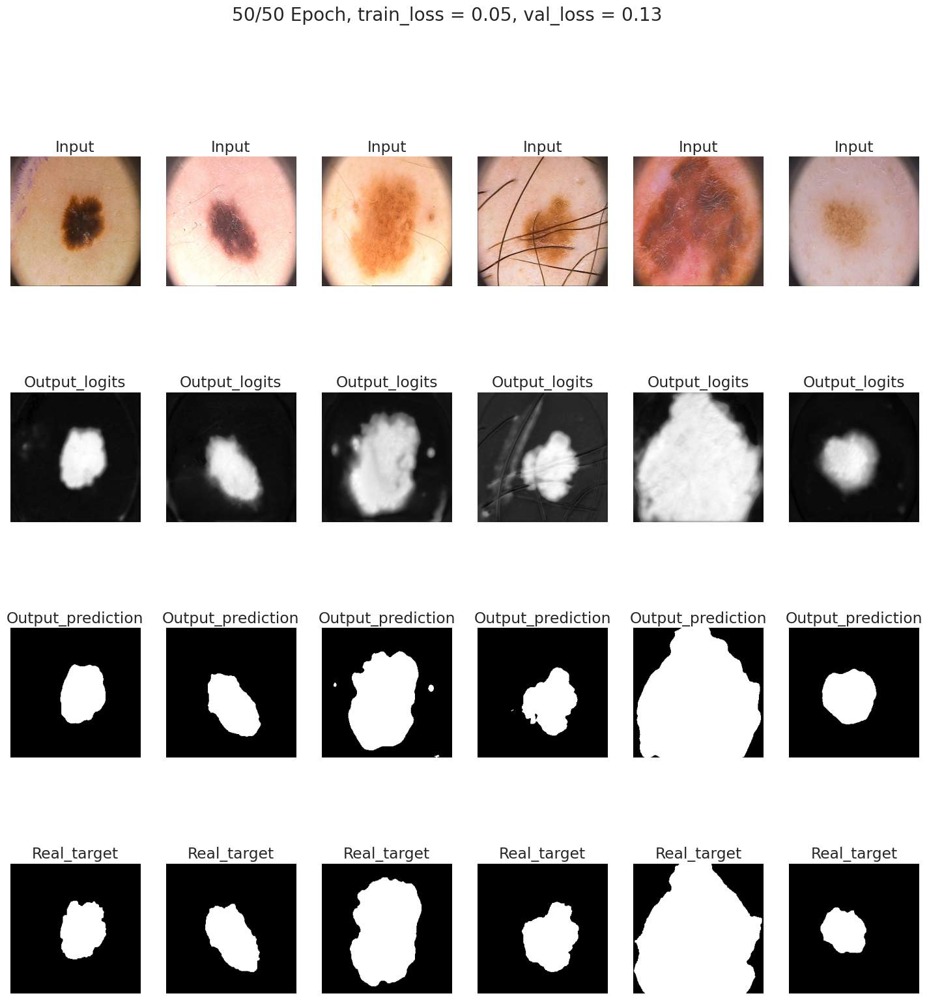

In [111]:
optim = torch.optim.AdamW(unet2_model.parameters(), lr=0.0008)
scheduler = lr_scheduler.StepLR(optim,step_size=10, gamma=0.7)
history_unet2 = train(unet2_model, optim, scheduler, bce_loss, max_epochs, data_tr, data_val)

Сделайте вывод, какая из моделей лучше

In [116]:
history_unet2['best_epoch']

32

In [117]:
score_model(unet2_model, iou_pytorch, data_val)

0.7779999673366547

In [118]:
unet2_model = UNet2().to(device)
unet2_model.load_state_dict(history_unet2['model_pars'])

<All keys matched successfully>

In [119]:
score_model(unet2_model, iou_pytorch, data_val)

0.7919999659061432

In [ ]:
sns.set(style="darkgrid", font_scale=1.4)

plt.figure(figsize=(12, 6))
plt.title("UNet2 (BCE_Loss) Training history")
plt.plot(range(max_epochs), history_unet2['train_loss'], label="Train_loss", linewidth=2)
plt.plot(range(max_epochs), history_unet2['val_loss'], label="Validation_loss", linewidth=2)
plt.legend()
plt.xlabel("Epoch")
plt.show()

# Отчет (6 баллов):
Ниже предлагается написать отчет о проделанно работе и построить графики для лоссов, метрик на валидации и тесте.
Если вы пропустили какую-то часть в задании выше, то вы все равно можете получить основную часть баллов в отчете, если правильно зададите проверяемые вами гипотезы.


Аккуратно сравните модели между собой и соберите наилучшую архитектуру. Проверьте каждую модель с различными лоссами. Мы не ограничиваем вас в формате отчета, но проверяющий должен отчетливо понять для чего построен каждый график, какие выводы вы из него сделали и какой общий вывод можно сделать на основании данных моделей. Если вы захотите добавить что-то еще, чтобы увеличить шансы получения максимального балла, то добавляйте отдельное сравнение.

Дополнительные комментарии:

Пусть у вас есть N обученных моделей.
- Является ли отчетом N графиков с 1 линей? Да, но очень низкокачественным, потому что проверяющий не сможет сам сравнить их.

- Является ли отчетом 1 график с N линиями? Да, но скорее всего таким образом вы отразили лишь один эффект. Этого мало, чтобы сделать досточно суждений по поводу вашей работа.

- Я проверял метрики на трейне, и привел в результате таблицу с N числами, что не так? ключейвой момент тут, что вы измеряли на трейне ваши метрики, уверены ли вы, что заивисмости останутся такими же на отложенной выборке?

- Я сделал отчет содержащий график лоссов и метрик, и у меня нет ошибок в основной части, но за отчет не стоит максимум, почему? Естестественно максимум баллов за отчет можно получить не за 2 графика (даже при условии их полной правильности). Проверяющий хочет видеть больше сравнений моделей, чем метрики и лоссы (особенно, если они на трейне).

Советы: попробуйте правильно поставить вопрос на который вы себе отвечаете и продемонстрировать таблицу/график, помогающий проверяющему увидеть ответ на этот вопрос. Пример: Ваня хочет узнать, с каким из 4-х лоссов модель (например, U-Net) имеет наилучшее качество. Что нужно сделать Ване? Обучить 4 одинаковых модели с разными лосс функциями. И измерить итогововое качество. Продемонстрировать результаты своих измерений и итоговый вывод. (warning: конечно же, это не идеально ответит на наш вопрос, так как мы не учитываем в экспериментах возможные различные типы ошибок, но для первого приближения этого вполне достаточно).

Примерное время на подготовку отчета 1 час, он содержит сравнеение метрик, график лоссов, выбор лучших моделей из нескольких кластеров и выбор просто лучшей модели, небольшой вывод по всему дз, возможно сравнение результирующих сегментаций, времени или числа параметров модели, проявляйте креативность.

 ## Отчет

Напишем новую функцию обучения без вывода картинок и промежуточных результатов. 
Будем также считать целевую метрику на каждой эпохе и записывать значения в историю обучения

In [60]:
def train_for_report(model, opt, scheduler, loss_fn, epochs, data_tr, data_val):
   
    history = {'train_loss':[],'val_loss':[],'train_score':[],'val_score':[]}
    best_loss = float('inf')
    best_score= 0
    
    for epoch in tqdm(range(epochs)):
        #print(f'epoch {epoch+1}/{epochs}')
        avg_loss_tr = 0
        model.train()  # train mode
        for X_batch, Y_batch in data_tr:
            # data to device
            X_batch = X_batch.to(device)
            Y_batch = Y_batch.to(device)
            # set parameter gradients to zero
            opt.zero_grad()

            # forward
            Y_pred = model(X_batch)
            loss = loss_fn(Y_batch, Y_pred ) # forward-pass
            loss.backward()  # backward-pass
            opt.step()  # update weights

            # calculate loss to show the user
            avg_loss_tr += loss.item() / len(data_tr)
            
        #calculate score train   
        score_tr = score_model(model, iou_pytorch, data_tr)
        history['train_score'].append(score_tr)
        #calculate score validation
        score_val = score_model(model, iou_pytorch, data_val)
        history['val_score'].append(score_val)
        
        scheduler.step()

        history['train_loss'].append(avg_loss_tr)
        #print(f'train loss:{avg_loss_tr}'')
       
        
        model.eval()  # testing mode
        avg_loss_val = 0
        with torch.no_grad():

            for X_batch, Y_batch in data_val:
                # data to device
                X_batch = X_batch.to(device)
                Y_batch = Y_batch.to(device)

                # forward
                Y_pred = model(X_batch)
                loss_val = loss_fn(Y_batch, Y_pred ) # forward-pass

                # calculate loss to show the user
                avg_loss_val += loss_val.item() / len(data_val)

              

            history['val_loss'].append(avg_loss_val)
            #print(f'val loss:'{avg_loss_val})
            
        if score_val > best_score:
            best_score = score_val
            pars = copy.deepcopy(model.state_dict()) # save model pars for best loss 
            history['model_pars_score'] = pars    #save model to history list
            history['best_epoch_score'] = epoch+1 #save best epoch to history list
          
        if avg_loss_val < best_loss:
            best_loss = avg_loss_val
            pars = copy.deepcopy(model.state_dict()) # save model pars for best loss
            history['model_pars_loss'] = pars    #save model to history list
            history['best_epoch_loss'] = epoch   #save best epoch to history list
        
        
    return history

In [330]:
torch.cuda.empty_cache()

Напишем цикл где по-новой обучим все модели со всеми лосссами 

In [129]:
models = {'Seg_Net':SegNet, 'UNet':UNet,'UNet2':UNet2}

loss_funcs = {'bce':bce_loss, 'dice': dice_loss, 'focal':focal_loss, 'ssl': struct_sim_loss}

train_histories = {}


for model_name, model_type in tqdm(models.items()):
    for loss_name, loss_function in tqdm(loss_funcs.items()):
        print(model_name,loss_name)
        model = model_type().to(device)
        optim = torch.optim.AdamW(model.parameters(), lr=0.0008)
        scheduler = lr_scheduler.StepLR(optim,step_size=10, gamma=0.7)
        max_epochs = 40
        train_histories[f'{model_name}__{loss_name}'] = train_for_report(model, optim, scheduler, loss_function, max_epochs, data_tr, data_val)
       
        

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Seg_Net bce


  0%|          | 0/40 [00:00<?, ?it/s]

Seg_Net dice


  0%|          | 0/40 [00:00<?, ?it/s]

Seg_Net focal


  0%|          | 0/40 [00:00<?, ?it/s]

Seg_Net ssl


  0%|          | 0/40 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

UNet bce


  0%|          | 0/40 [00:00<?, ?it/s]

UNet dice


  0%|          | 0/40 [00:00<?, ?it/s]

UNet focal


  0%|          | 0/40 [00:00<?, ?it/s]

UNet ssl


  0%|          | 0/40 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

UNet2 bce


  0%|          | 0/40 [00:00<?, ?it/s]

OutOfMemoryError: CUDA out of memory. Tried to allocate 400.00 MiB (GPU 0; 14.76 GiB total capacity; 12.92 GiB already allocated; 7.75 MiB free; 13.72 GiB reserved in total by PyTorch) If reserved memory is >> allocated memory try setting max_split_size_mb to avoid fragmentation.  See documentation for Memory Management and PYTORCH_CUDA_ALLOC_CONF

К сожалению закончилась GPU память. Нам осталось собрать историю с обучением Unet2

In [285]:
train_histories1 = train_histories.copy()

NameError: name 'train_histories' is not defined

In [ ]:
import pickle
with open('train_hist1.pkl', 'wb') as file:
    pickle.dump(train_histories1, file)   #сохраним то что натренировали в файл и если надо будет перезапуститить среду восстановим историю из файла

In [350]:
gc.collect()

torch.cuda.empty_cache()

In [352]:
model_type = UNet2
model_name = 'Unet2'
loss_funcs = {'bce':bce_loss, 'dice': dice_loss, 'focal':focal_loss, 'ssl': struct_sim_loss}
unet_train_histories = {}

for loss_name, loss_function in tqdm(loss_funcs.items()):
    print(model_name,loss_name)
    model = model_type().to(device)
    optim = torch.optim.AdamW(model.parameters(), lr=0.0008)
    scheduler = lr_scheduler.StepLR(optim,step_size=10, gamma=0.7)
    max_epochs = 40
    unet_train_histories[f'{model_name}__{loss_name}'] = train_for_report(model, optim, scheduler, loss_function, max_epochs, data_tr, data_val)


  0%|          | 0/4 [00:00<?, ?it/s]

Unet2 bce


  0%|          | 0/40 [00:00<?, ?it/s]

Unet2 dice


  0%|          | 0/40 [00:00<?, ?it/s]

Unet2 focal


  0%|          | 0/40 [00:00<?, ?it/s]

OutOfMemoryError: CUDA out of memory. Tried to allocate 400.00 MiB (GPU 0; 14.76 GiB total capacity; 12.55 GiB already allocated; 331.75 MiB free; 13.40 GiB reserved in total by PyTorch) If reserved memory is >> allocated memory try setting max_split_size_mb to avoid fragmentation.  See documentation for Memory Management and PYTORCH_CUDA_ALLOC_CONF

Опять закончилась память ) Осталось еще две модельки

Запишем в общую историю то что обучили

In [355]:
train_histories1['Unet2__bce'] = unet_train_histories['Unet2__bce'].copy()
train_histories1['Unet2__dice'] = unet_train_histories['Unet2__dice'].copy()

In [385]:
torch.cuda.empty_cache()
gc.collect()

0

In [61]:
model_type = UNet2
model_name = 'Unet2'
loss_funcs = {'focal':focal_loss, 'ssl': struct_sim_loss}
unet2_train_histories = {}

for loss_name, loss_function in tqdm(loss_funcs.items()):
    print(model_name,loss_name)
    model = model_type().to(device)
    optim = torch.optim.AdamW(model.parameters(), lr=0.0008)
    scheduler = lr_scheduler.StepLR(optim,step_size=10, gamma=0.7)
    max_epochs = 40
    unet2_train_histories[f'{model_name}__{loss_name}'] = train_for_report(model, optim, scheduler, loss_function, max_epochs, data_tr, data_val)


  0%|          | 0/2 [00:00<?, ?it/s]

Unet2 focal


  0%|          | 0/40 [00:00<?, ?it/s]

Unet2 ssl


  0%|          | 0/40 [00:00<?, ?it/s]

In [62]:
import pickle

Итак обучение закончено!
Но среду пришлось перезапуститить все равно поэтому выгружаем сохраненную историю обучения и добавляем в нее две последние модели

In [66]:
path = '/kaggle/input/history-data/train_hist1.pkl'
with open(path, 'rb') as file:
    train_histories1 = pickle.load(file)

In [65]:
train_histories1.keys()

dict_keys(['Seg_Net__bce', 'Seg_Net__dice', 'Seg_Net__focal', 'Seg_Net__ssl', 'UNet__bce', 'UNet__dice', 'UNet__focal', 'UNet__ssl', 'Unet2__bce', 'Unet2__dice'])

In [67]:
train_histories1['Unet2__focal'] = unet2_train_histories['Unet2__focal'].copy()
train_histories1['Unet2__ssl'] = unet2_train_histories['Unet2__ssl'].copy()

In [153]:
import pickle
with open('train_hist1.pkl', 'wb') as file:
    pickle.dump(train_histories1, file)

In [70]:
import re

In [72]:
train_histories1['Seg_Net__bce'].keys()

dict_keys(['train_loss', 'val_loss', 'train_score', 'val_score', 'model_pars_loss', 'best_epoch_loss', 'model_pars_score', 'best_epoch_score'])

Данные собраны можно строить и изучать графики

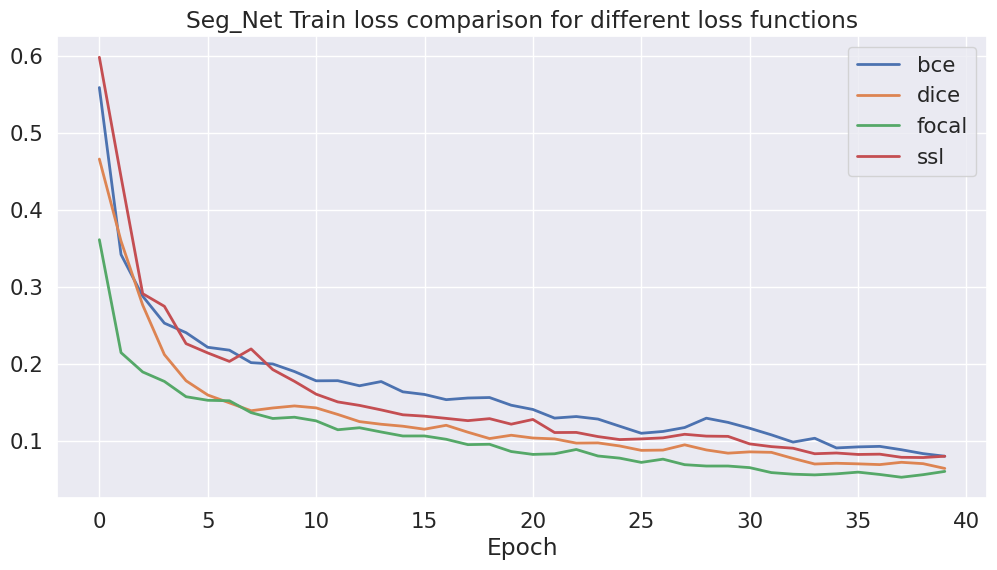

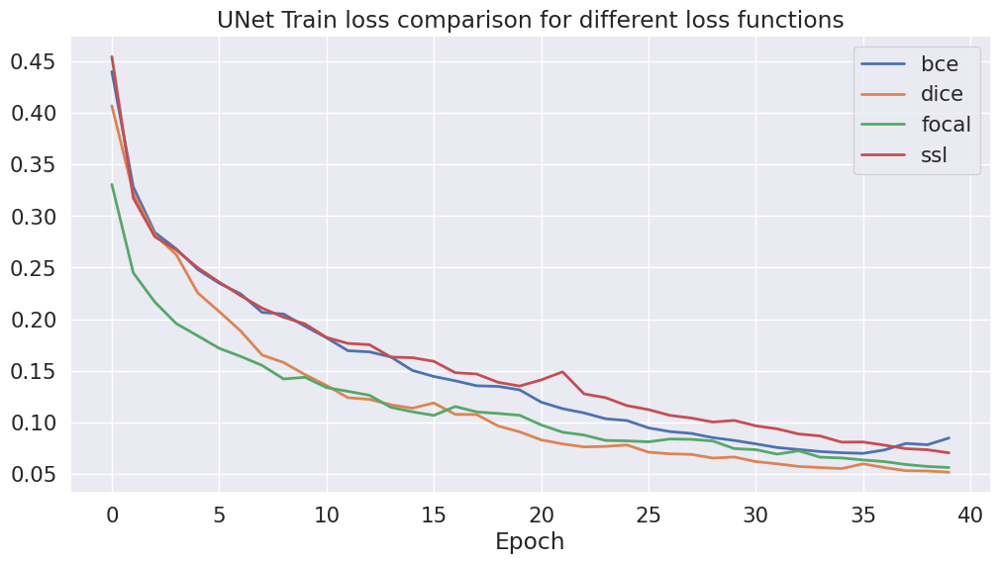

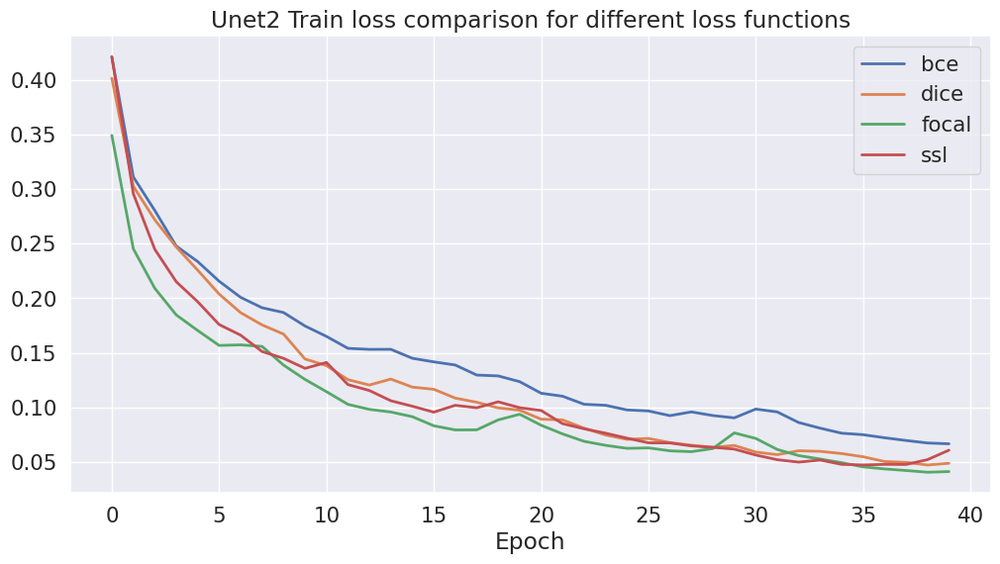

In [74]:
import seaborn as sns
sns.set(style="darkgrid", font_scale=1.4)
models = ('Seg_Net', 'UNet','Unet2')
for model in models:
    plt.figure(figsize=(12, 6))
    plt.title(f"{model} Train loss comparison for different loss functions")
    for item_name, item_data in train_histories1.items():
        if model == re.search(r'(.+)__(.+)', item_name).group(1):     
            plt.plot(range(max_epochs), item_data['train_loss'], label=re.search(r'(.+)__(.+)',item_name).group(2), linewidth=2)
    
    plt.legend()
    plt.xlabel("Epoch")
    plt.show()

Все модели адекватно обучаются на всех 4 предложенных функциях потерь. Графики падения потерь на обучающей выборке схожи между моделями

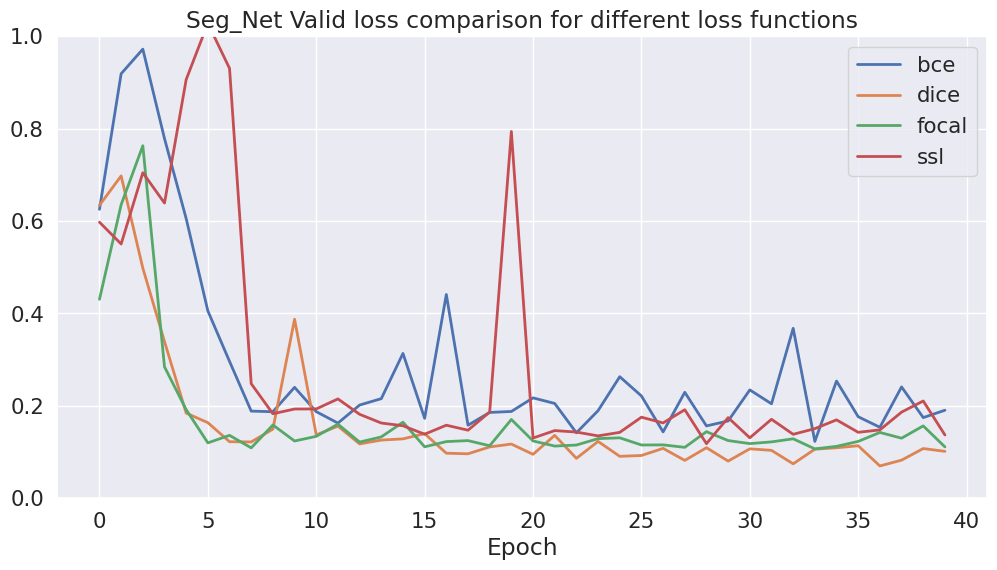

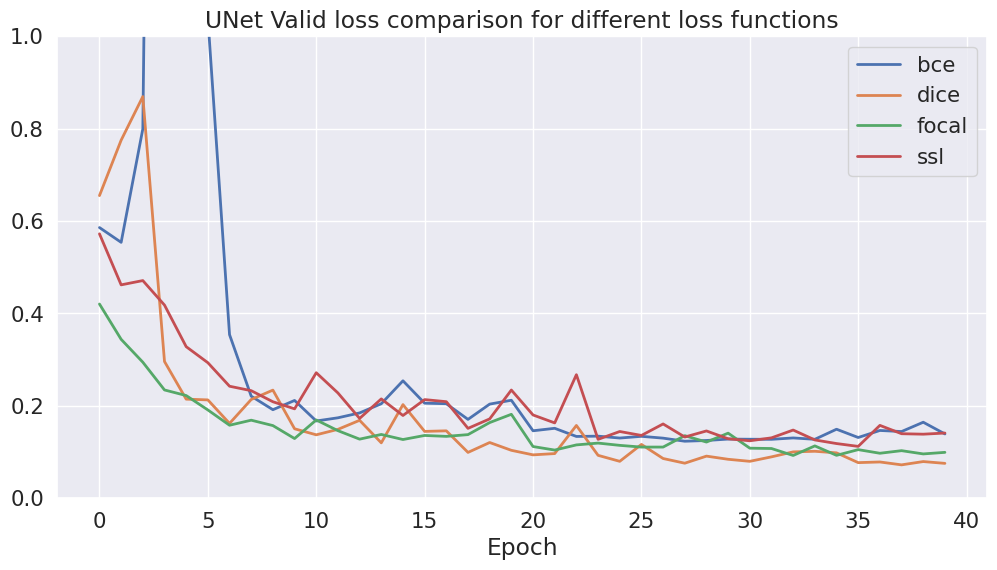

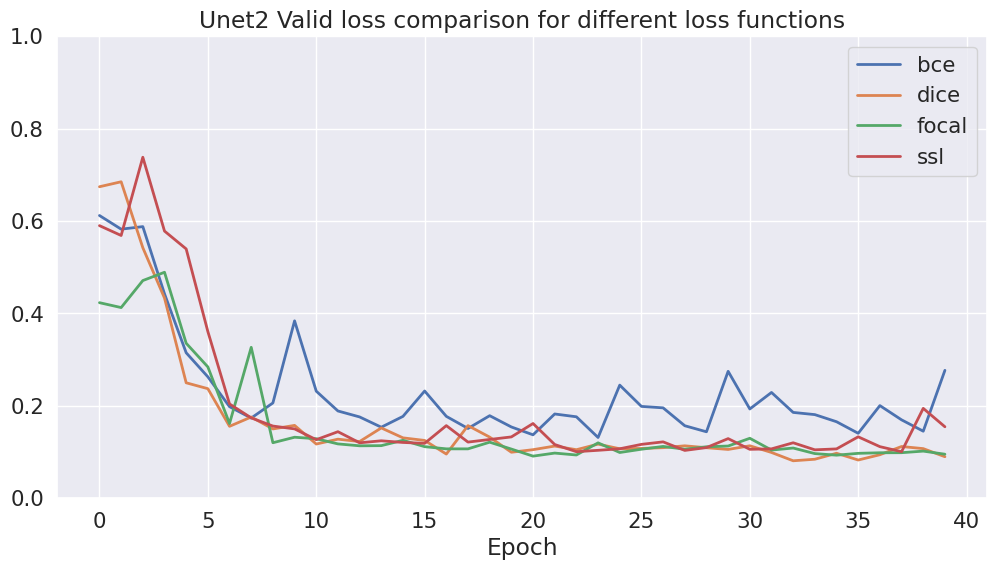

In [86]:
sns.set(style="darkgrid", font_scale=1.4)

for model in models:
    plt.figure(figsize=(12, 6))
    plt.title(f"{model} Valid loss comparison for different loss functions")
    for item_name, item_data in train_histories1.items():
        if model == re.search(r'(.+)__(.+)', item_name).group(1):     
            plt.plot(range(max_epochs), item_data['val_loss'], label=re.search(r'(.+)__(.+)',item_name).group(2), linewidth=2)
    
    plt.ylim([0,1])
    plt.legend()
    plt.xlabel("Epoch")
    plt.show()

Для архитектуры SegNet можно сказать, что все 4 функции потерь выходят на "плато" примерно с 15 эпохой обучения и тут значения функции потерь начинают флуктуировать в районе ~0.15. Однако сильного переобучения моделей не происходит - мы не наблюдаем откровенного восходящего тренда для графиков функции потерь. На графике для архитектуры SegNet видны сильные всплески значений функции потерь у BCE и SSL причем уже примерно в середине цикла обучения. Более "стабильными" выглядят функции FOCAL и DICE. 

Для UNet таких резких всплесков не наблюдается возможно это объясняется тем, что это более глубокая сеть с почти 2.5х кратным количеством параметров. Также видно, что с функцией потерь BCE и SSL к концу обучения появляется тренд на рост значений потерь.

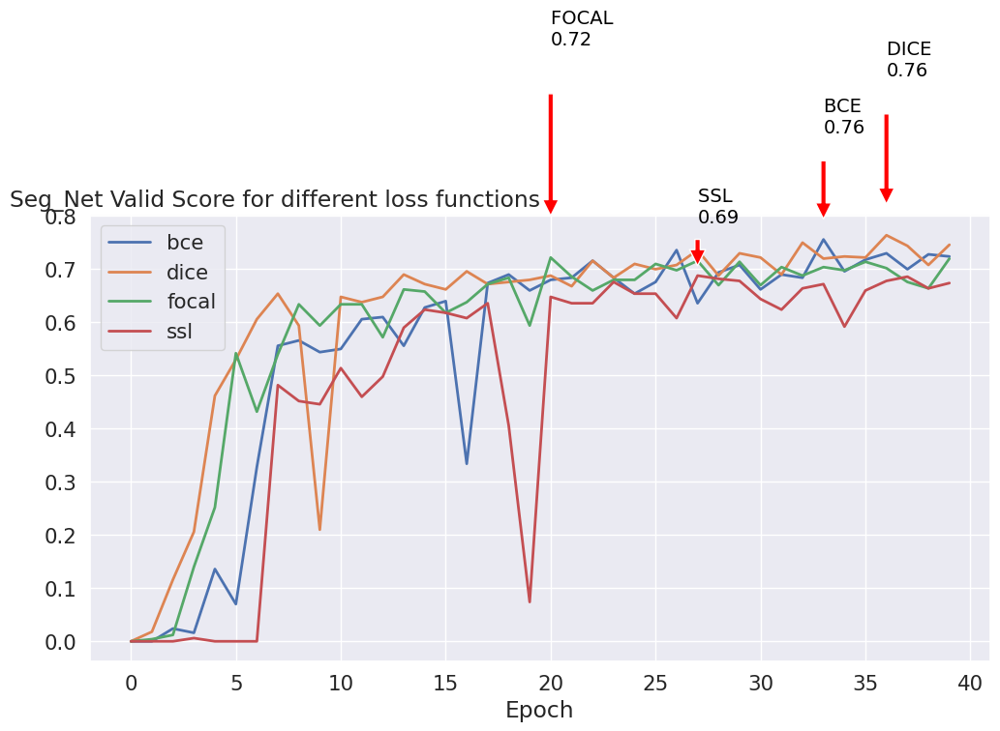

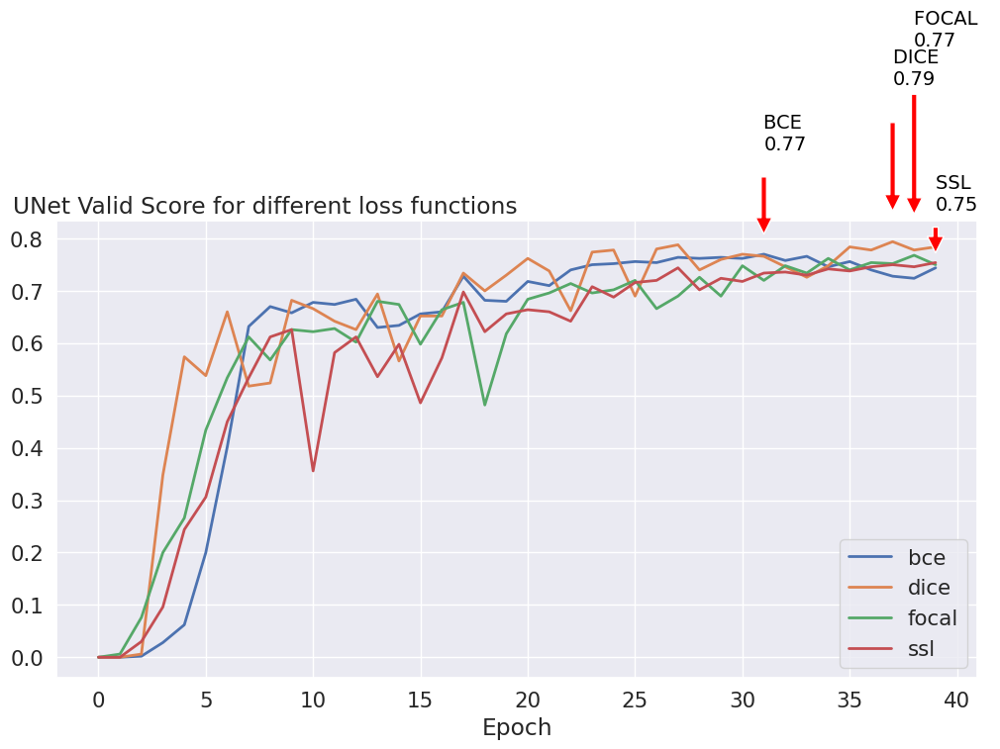

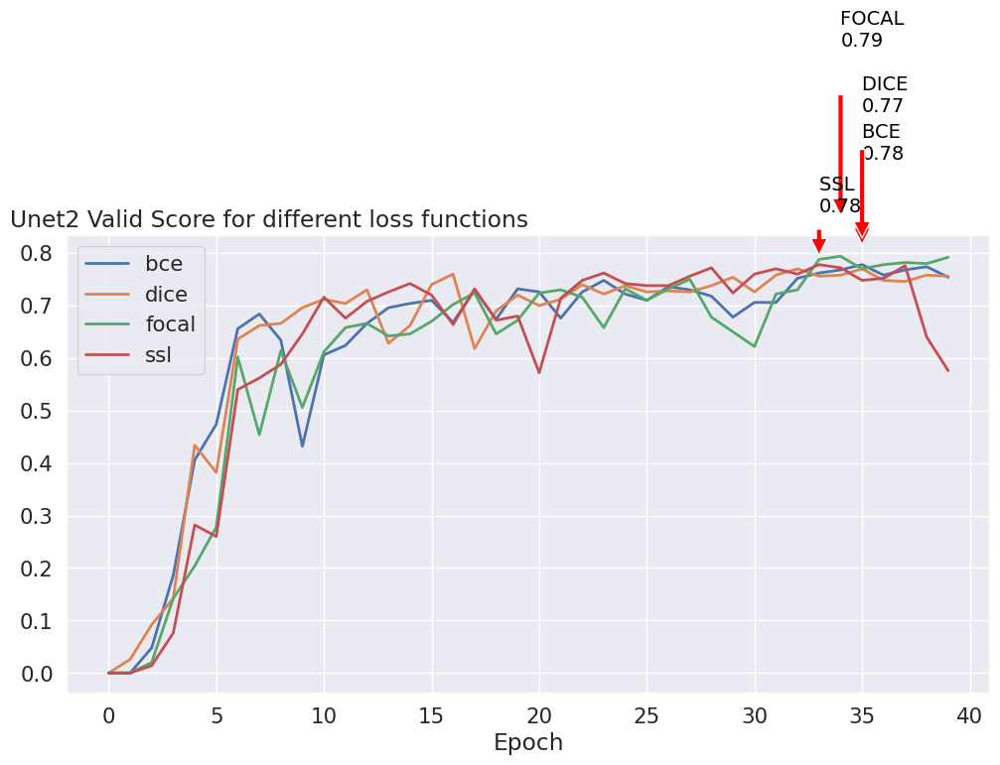

In [87]:
sns.set(style="darkgrid", font_scale=1.4)

for model in models:
    plt.figure(figsize=(12, 6))
    plt.title(f"{model} Valid Score for different loss functions", fontdict = {'horizontalalignment':'right'} )
    for i, (item_name, item_data) in enumerate(train_histories1.items(),start=1):
        if model == re.search(r'(.+)__(.+)', item_name).group(1):     
            
            plt.plot(range(max_epochs), item_data['val_score'], label=re.search(r'(.+)__(.+)',item_name).group(2), linewidth=2)
            
            # Находим индекс максимального значения скора
            max_index = np.argmax(item_data['val_score'])
            
            # Добавляем аннотацию на график
            plt.annotate(f'{(re.search(r"(.+)__(.+)",item_name).group(2)).upper()}  \n{item_data["val_score"][max_index]:.2f}',
                         xy=(max_index, item_data['val_score'][max_index]),
                         xytext=(max_index  , item_data['val_score'][max_index] + (1+i % 4)/10),
                         arrowprops=dict(facecolor='red',
                                         shrink=0.2),
                         fontsize=14,
                         color='black'
                         )
                         
    
    plt.legend()
    plt.xlabel("Epoch")
    plt.show()

С точки зрения значений целевой метрики лидеры функций потерь это DICE и FOCAL! Для двух типов архитектур DICE показал наилучший результат среди других функций потерь. FOCAL также показал стабильные высокие результаты на всех трех моделях. Также, хочется отметить: несмотря на то, что на графиках валидационных потерь мы видели ситуацию, когда потери практически перестали уменьшаться после ~15 эпохи обучения, для целевой метрики мы видим тренд на ее рост вплоть до окончания обучения.

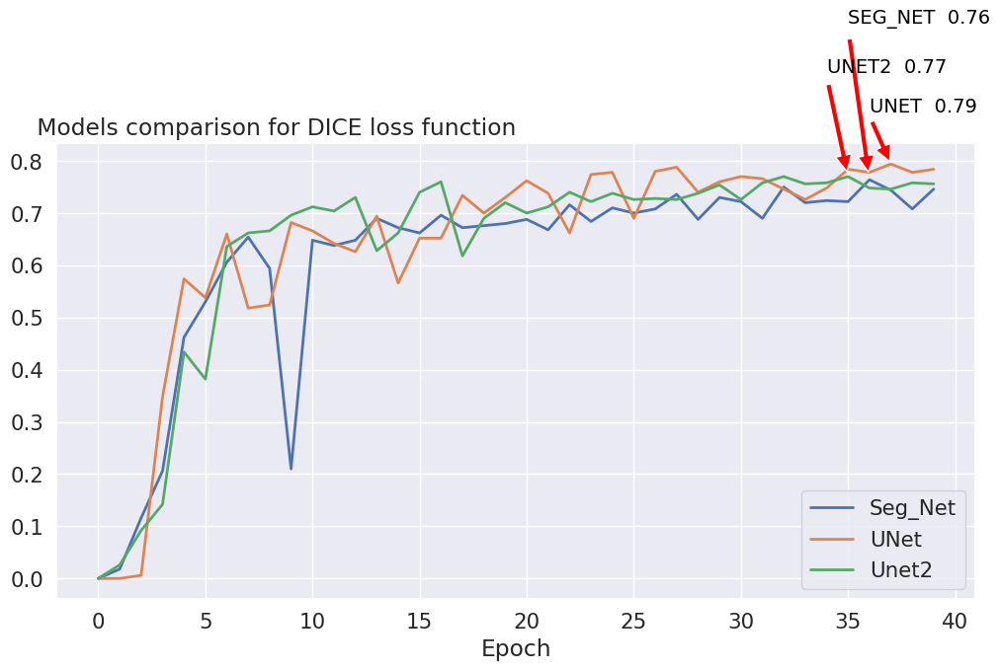

In [103]:
sns.set(style="darkgrid", font_scale=1.4)


plt.figure(figsize=(12, 6))
plt.title(f" Models comparison for DICE loss function", fontdict = {'horizontalalignment':'right'} )

for i, (item_name, item_data) in enumerate(train_histories1.items(),start=1):
    if 'dice' == re.search(r'(.+)__(.+)', item_name).group(2):     
        plt.plot(range(max_epochs), item_data['val_score'], label=re.search(r'(.+)__(.+)',item_name).group(1), linewidth=2)
        
        # Находим индекс максимального значения скора
        max_index = np.argmax(item_data['val_score'])

        # Добавляем аннотацию на график
        plt.annotate(f'{(re.search(r"(.+)__(.+)",item_name).group(1)).upper()}  {item_data["val_score"][max_index]:.2f}',
                     xy=(max_index, item_data['val_score'][max_index]),
                     xytext=(max_index - 1 , item_data['val_score'][max_index] + (1+i%3)/10 ),
                     arrowprops=dict(facecolor='red',
                                     shrink=0.05),
                     fontsize=14,
                     color='black'
                     )


plt.legend()
plt.xlabel("Epoch")
plt.show()

Выше построены графики сравнения кривых обучения для трех типов архитектур (все с функцией потерь DICE).
Архитектура UNet c bypass слоями достигает наилучшего скора. Видно, что примерно с 17 эпохи архитектура UNet выходит вперед и далее показывает стабильно лучший скор чем SegNet.

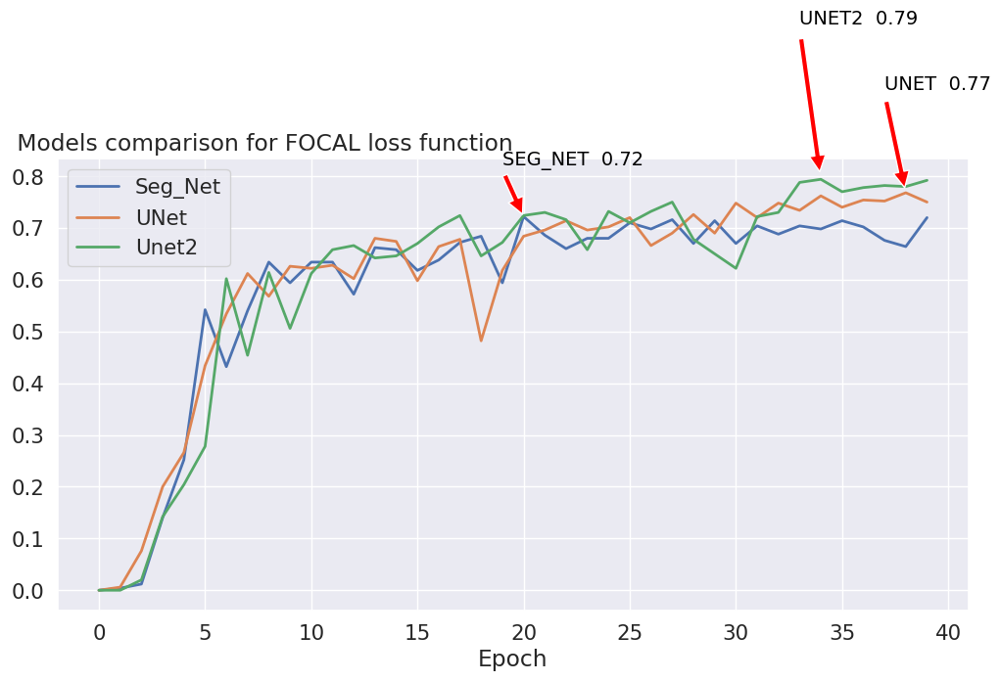

In [104]:
sns.set(style="darkgrid", font_scale=1.4)


plt.figure(figsize=(12, 6))
plt.title(f" Models comparison for FOCAL loss function", fontdict = {'horizontalalignment':'right'} )

for i, (item_name, item_data) in enumerate(train_histories1.items(),start=1):
    if 'focal' == re.search(r'(.+)__(.+)', item_name).group(2):     
        plt.plot(range(max_epochs), item_data['val_score'], label=re.search(r'(.+)__(.+)',item_name).group(1), linewidth=2)
        
        # Находим индекс максимального значения скора
        max_index = np.argmax(item_data['val_score'])

        # Добавляем аннотацию на график
        plt.annotate(f'{(re.search(r"(.+)__(.+)",item_name).group(1)).upper()}  {item_data["val_score"][max_index]:.2f}',
                     xy=(max_index, item_data['val_score'][max_index]),
                     xytext=(max_index - 1 , item_data['val_score'][max_index] + (1+i%3)/10 ),
                     arrowprops=dict(facecolor='red',
                                     shrink=0.05),
                     fontsize=14,
                     color='black'
                     )


plt.legend()
plt.xlabel("Epoch")
plt.show()

Выше построены графики сравнения кривых обучения для трех типов архитектур (все с функцией потерь FOCAL).
Архитектура UNet2 c bypass слоями достигает наилучшего скора. 

In [105]:
train_histories1['Seg_Net__bce'].keys()

dict_keys(['train_loss', 'val_loss', 'train_score', 'val_score', 'model_pars_loss', 'best_epoch_loss', 'model_pars_score', 'best_epoch_score'])

In [109]:
table={}
for key, item in train_histories1.items():
    table.setdefault('name',[]).append(key)
    table.setdefault('max_val_score',[]).append(max(item['val_score']))
    table.setdefault('epoch',[]).append(item['best_epoch_score'])
    table.setdefault('corr_val_loss',[]).append(item['val_loss'][np.argmax(item['val_score'])])

In [112]:
import pandas as pd
table = pd.DataFrame(table)
display(table.sort_values(by='max_val_score', ascending=False))

,name,max_val_score,epoch,corr_val_loss
5,UNet__dice,0.794,38,0.072283
10,Unet2__focal,0.794,35,0.093248
8,Unet2__bce,0.778,36,0.140604
11,Unet2__ssl,0.778,34,0.104826
4,UNet__bce,0.770,32,0.127547
9,Unet2__dice,0.770,36,0.082756
6,UNet__focal,0.768,39,0.095952
1,Seg_Net__dice,0.764,37,0.069877
0,Seg_Net__bce,0.756,34,0.123098
7,UNet__ssl,0.754,40,0.141162


Более эффективной оказалась архитектура UNet а какая из двух сетей Unet лучше сказать сложно при каждом запуске получаются немного разные результаты в пределах, погрешности метрики +-2%. Например в разделе создания моделей Unet2 показал себя сильнее чем Unet однако в ходе повторного обучения всех моделей со всеми лосс функциями они примерно одинаковыю. 

Подойдем формально: у Unet2 был лучше скор когда первый раз обучали эту модель. И на представленном лидер-борде в ТОП-6 архитектура Unet2 встречается 4 раза.

Ну и лосс функцию возьмем лучшую для Unet2 в ходе испытаний - focal. (она в среднем по всем моделям для нашей задачи хорошо себея проявила)

Загрузим обученную модель Unet2 на focal_loss

In [145]:
b_pars = train_histories1['Unet2__focal']['model_pars_score']

final_model = UNet2().to(device)

final_model.load_state_dict(b_pars)

<All keys matched successfully>

Попробуем дообучить модель на валидационной выборке и посмотрим скор на тесте

In [252]:
optim = torch.optim.AdamW(final_model.parameters(), lr=0.00001)
scheduler = lr_scheduler.StepLR(optim,step_size=10, gamma=1) #не будем использовать
max_epochs = 10
best_model_fine_tuning = train_for_report(final_model, optim, scheduler, focal_loss, max_epochs, data_val, data_val)


  0%|          | 0/10 [00:00<?, ?it/s]

In [259]:
final_model.to(device)
score_model(final_model, iou_pytorch, data_ts)

0.7719999849796295

Вполне приемлимый результат

Вывод: в ходе работы я с практической стороны познакомился с решением задачи бинарной сегментации изображений на довольно простом, но специфичном датасете. Удалось реализовать две популярные архитектуры сетей для таких задач SegNet и UNet (с разными видами upsampling), также проводилось тестирование различных функций потерь и даже самостоятельная реализация функции потерь Structural Similarity Loss, однако, к сожалению, с данным датасетом эта функция не проявила себя.

Хочется отметить, что чисто визуально все модели и все лосс функции отлично справляются с предложенной задачей сегментации, и иногда даже кажется, что делают это лучше чем предложенная целевая сегментация которая визуально иногда кажется спорной, а вариант предложенной моделью точнее.

C выбранной моделью (Unet2_focal_loss) удалось достигнуть скора на тестовой выборке 0.77

Конечно, на практике имеет смысл оптимизировать процесс обучения (подбор lr, настроек планировщика, итд) под каждую функцию потерь и архитектуру, но в данном учебном контексте мне показалось это лишним и скучным (подбор гиперпараметров обучения для 12 моделей в рамках домашнего задания это ту мач, а главное практически бесполезно так как и так все модели показывают отличный результат девиация метрик чуть вокруг 0.77 это подтверждает) поэтому тестирование проводилось на настройках обучения выбранных для самой первой модели.

